In [3]:
# Python packages
import scanpy as sc
import scib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import anndata as ad
import seaborn as sns
import celltypist
from celltypist import models
from scipy.stats import median_abs_deviation
from scipy.sparse import csr_matrix, issparse

# Set scanpy figure parameters
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=150,
    dpi_save=700,
    facecolor="white",
    vector_friendly=False,
    frameon=False,
)

# R interface
from rpy2.robjects import pandas2ri
from rpy2.robjects import r
import rpy2.rinterface_lib.callbacks as rcb
import rpy2.robjects as ro
import anndata2ri
import logging

rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

# Analyze the organ mesothelia scRNA-seq data from this paper: https://www.sciencedirect.com/science/article/pii/S2211124723002218. Below, we provide example code for pre-processing of the E13.5 lung. The E13.5 pancreas was processed in an identical manner. 

## The scRNA_seq analysis workflow below is heavily inspired by Theis Lab's single-cell best practise guide.

In [3]:
adata = sc.read_10x_h5(
    filename="filtered_feature_bc_matrix.h5"
)
adata

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 8439 × 32285
    var: 'gene_ids', 'feature_types', 'genome'

In [4]:
adata.var_names_make_unique()
adata

AnnData object with n_obs × n_vars = 8439 × 32285
    var: 'gene_ids', 'feature_types', 'genome'

In [5]:
# Define gene groups for which we will calculate the proportion of counts. We selected mitochondrial, ribosomal, and hemoglobin genes. 
# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("mt-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("rps", "rpl"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains(("^hb[^(p)]"))

In [6]:
# Calculate QC metrics
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
adata

AnnData object with n_obs × n_vars = 8439 × 32285
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

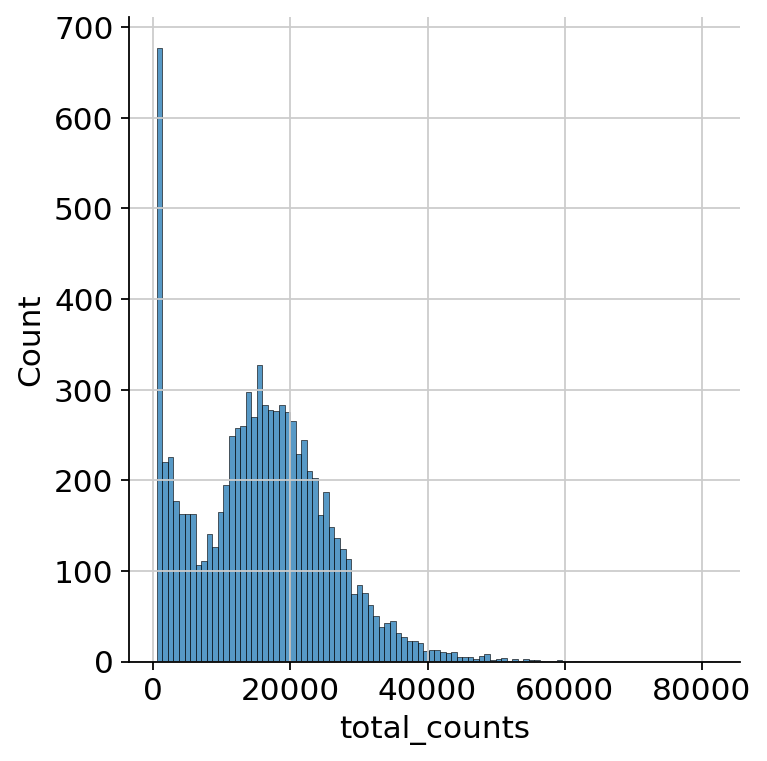

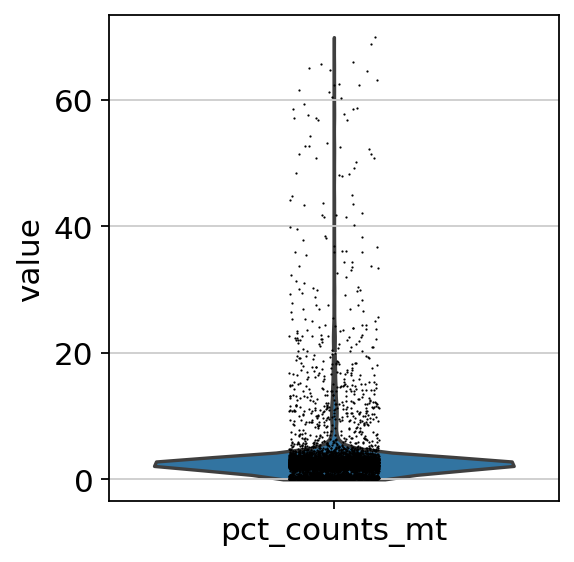

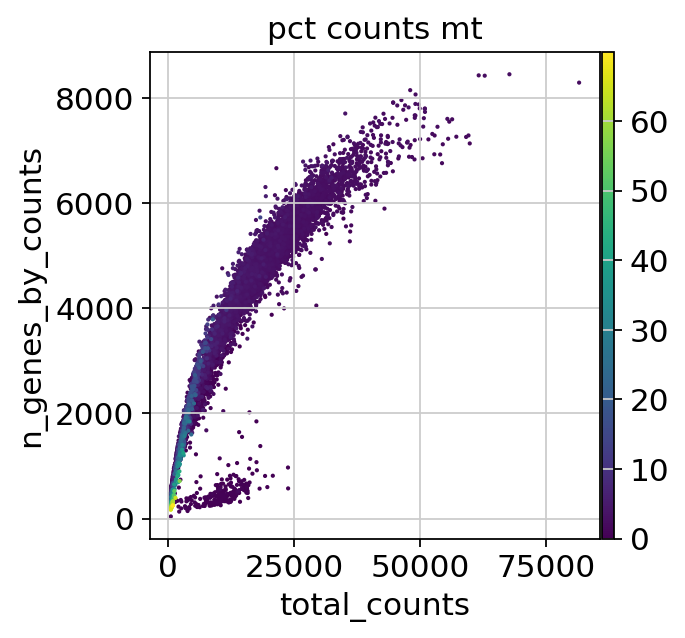

In [7]:
# Plot the three QC covariates. 
p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False)
# sc.pl.violin(adata, 'total_counts')
p2 = sc.pl.violin(adata, "pct_counts_mt")
p3 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [9]:
# Define a function to filter cells based on QC metrics using meidan absolute deviation
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [10]:
### Apply this function to the log1p_total_counts, log1p_n_genes_by_counts and pct_counts_in_top_20_genes metrics, each with a threshold of 5 MAD, #####
### to filter out low-quality barcodes### 
adata.obs["outlier"] = (
    is_outlier(adata, "log1p_total_counts", 5)
    | is_outlier(adata, "log1p_n_genes_by_counts", 5)
    | is_outlier(adata, "pct_counts_in_top_20_genes", 5)
)
adata.obs.outlier.value_counts()

False    6868
True     1571
Name: outlier, dtype: int64

In [15]:
### Cardiac cells are known to have a high percentage of mitochondrial counts. Therefore, the fraction of counts from mitochondrial genes per barcode###
###may not optimally distinguish dead cells from bona fide cardiac cells. For this reason, we applied a very permissive strategy, flagging cells as ###
###as outliers with the MAD threshold of 3.###
adata.obs["mt_outlier"] = is_outlier(adata, "pct_counts_mt", 3) 
adata.obs.mt_outlier.value_counts()

False    6486
True     1953
Name: mt_outlier, dtype: int64

In [16]:
####Having flagged outliers through two strategies, we now filter out outliers 
print(f"Total number of cells: {adata.n_obs}")
adata = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")

Total number of cells: 8439
Number of cells after filtering of low quality cells: 5995


In [19]:
%%R
library(SoupX)


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

In [21]:
###SoupX runs better if basic clustering is provided. Therefore, we normalise counts data using the shifted logarithm approach, perform dimensionality###
###reduction, and leiden clustering####
adata_pp = adata.copy()
sc.pp.normalize_per_cell(adata_pp)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp)
sc.pp.neighbors(adata_pp)
sc.tl.leiden(adata_pp, key_added="soupx_groups")

# Preprocess variables for SoupX
soupx_groups = adata_pp.obs["soupx_groups"]

2024-06-10 04:54:12.491411: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-10 04:54:12.519894: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-10 04:54:12.519915: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-10 04:54:12.520704: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-10 04:54:12.525508: I tensorflow/core/platform/cpu_feature_guar

In [23]:
####Transpose the matrix to be compatible with SoupX###
cells = adata.obs_names
genes = adata.var_names
data = adata.X.T

In [24]:
####SoupX also requires the raw gene by cells matrix from 10X Cellranger output, so we prepare it below. The raw table of droplets allows soupX to####
###reconstruct the ambient RNA expression profile, based on empty droplets, and estimate contamination. More details can be found on the package github##
adata_raw = sc.read_10x_h5(
    filename="raw_feature_bc_matrix.h5"
)
adata_raw.var_names_make_unique()
data_tod = adata_raw.X.T

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [26]:
%%R -i data -i data_tod -i genes -i cells -i soupx_groups -o out 

# Here, we specify row and column names of data
rownames(data) = genes
colnames(data) = cells
# We convert table of counts and table of droplets into sparse matrix format for compatibility with soupX
data <- as(data, "sparseMatrix")
data_tod <- as(data_tod, "sparseMatrix")

# Generate SoupChannel Object for SoupX 
sc = SoupChannel(data_tod, data, calcSoupProfile = FALSE)

# Add extra meta data to the SoupChannel object
soupProf = data.frame(row.names = rownames(data), est = rowSums(data)/sum(data), counts = rowSums(data))
sc = setSoupProfile(sc, soupProf)
# Set cluster information in SoupChannel
sc = setClusters(sc, soupx_groups)

# Run the function to estimate contamination fraction
sc  = autoEstCont(sc, doPlot=FALSE)
# Infer corrected table of counts and rount to integer
out = adjustCounts(sc, roundToInt = TRUE)

1428 genes passed tf-idf cut-off and 29 soup quantile filter.  Taking the top 29.
Using 229 independent estimates of rho.
Estimated global rho of 0.01
Expanding counts from 17 clusters to 5995 cells.
In addition: Warning message:
In sparseMatrix(i = out@i[w] + 1, j = out@j[w] + 1, x = out@x[w],  :
  'giveCsparse' is deprecated; setting repr="T" for you


In [27]:
#Set the .X layer of the anndata object with the soupX-corrected matrix
adata.layers["counts"] = adata.X
adata.layers["soupX_counts"] = out.T
adata.X = adata.layers["soupX_counts"]

In [28]:
###Next, we filter out genes that are not expressed by at least 20 cells. These genes are not informative.###
print(f"Total number of genes: {adata.n_vars}")

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print(f"Number of genes after cell filter: {adata.n_vars}")

Total number of genes: 32285
Number of genes after cell filter: 17207


# We now detect doublets

In [ ]:
### Load the required packages###
%%R
library(Seurat)
library(scater)
library(scDblFinder)
library(BiocParallel)

In [30]:
### Load the required packages###
data_mat = adata.X.T

In [31]:
### Launch doublet detection, store the annotation and doublet score computed by scDblFinder in the .obs of our anndata object. We also set seed###
### for reproducibility. 
%%R -i data_mat -o doublet_score -o doublet_class

set.seed(123)
sce = scDblFinder(
    SingleCellExperiment(
        list(counts=data_mat),
    ) 
)
doublet_score = sce$scDblFinder.score
doublet_class = sce$scDblFinder.class

Creating ~4796 artificial doublets...
Dimensional reduction
Evaluating kNN...
Training model...
iter=0, 488 cells excluded from training.
iter=1, 480 cells excluded from training.
iter=2, 473 cells excluded from training.
Threshold found:0.394
380 (6.3%) doublets called


In [32]:
adata.obs["scDblFinder_score"] = doublet_score
adata.obs["scDblFinder_class"] = doublet_class
adata.obs.scDblFinder_class.value_counts()

singlet    5615
doublet     380
Name: scDblFinder_class, dtype: int64

## Next, we normalise the data. We will normalise using the log1p approach for basc normalisation and using the scran method to select highly-variable genes. 

In [35]:
# Normalise and perform log1p transformation
scales_counts = sc.pp.normalize_total(adata, target_sum=None, inplace=False)
adata.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

In [37]:
# Load the required packages for scran normalisation
%%R
library(scran)
library(BiocParallel)

In [38]:
# scran requires a coarse clustering input. We will pre-process the data, cluster the data at low resolution to estimate size factors
adata_pp = adata.copy()
sc.pp.normalize_total(adata_pp)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.leiden(adata_pp, key_added="groups")

In [39]:
data_mat = adata_pp.X.T
# convert to CSC if possible. See https://github.com/MarioniLab/scran/issues/70
if issparse(data_mat):
    if data_mat.nnz > 2**31 - 1:
        data_mat = data_mat.tocoo()
    else:
        data_mat = data_mat.tocsc()
ro.globalenv["data_mat"] = data_mat
ro.globalenv["input_groups"] = adata_pp.obs["groups"]

In [41]:
# Compute the size factors
%%R -o size_factors

size_factors = sizeFactors(
    computeSumFactors(
        SingleCellExperiment(
            list(counts=data_mat)), 
            clusters = input_groups,
            min.mean = 0.1,
            BPPARAM = MulticoreParam()
    )
)

In [42]:
# Obtain the size factor to normalise the data and apply log1p transformation
adata.obs["size_factors"] = size_factors
scran = adata.X / adata.obs["size_factors"].values[:, None]
adata.layers["scran_normalization"] = csr_matrix(sc.pp.log1p(scran))

## Next, we perform highly informative feature selection using the deviance method. 

In [2]:
%%R
library(scry)

In [6]:
# Save anndata object in the R environment
ro.globalenv["adata"] = adata

In [7]:
# We call feature selection with deviance on the non-normalized counts matrix. 
%%R
sce = devianceFeatureSelection(adata, assay="X")

In [8]:
# Export the binomial deviance values as a vector.
binomial_deviance = ro.r("rowData(sce)$binomial_deviance").T

In [9]:
# Select the top 4,000 highly deviant genes
idx = binomial_deviance.argsort()[-4000:]
mask = np.zeros(adata.var_names.shape, dtype=bool)
mask[idx] = True

adata.var["highly_deviant"] = mask
adata.var["binomial_deviance"] = binomial_deviance

In [12]:
# Perform dimensionality reduction and clustering. First, set the .X layer to log1p-normalised counts. 
adata.X = adata.layers["log1p_norm"]

In [13]:
# setting highly variable as highly deviant to use scanpy 'use_highly_variable' argument in sc.pp.pca
adata.var["highly_variable"] = adata.var["highly_deviant"]
sc.pp.pca(adata, svd_solver="arpack", use_highly_variable=True)

In [14]:
# Infer neighbohood graph, run UMAP, and deploy leiden clustering with three resolutions to gain flexibility in cell type detection
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)
sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5)
sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0)

2024-06-10 05:08:23.846906: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-10 05:08:23.874612: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-10 05:08:23.874632: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-10 05:08:23.875360: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-10 05:08:23.879973: I tensorflow/core/platform/cpu_feature_guar

In [1]:
import scanpy as sc
adata = sc.read('/mnt/sdb/qdang/singlecell/mesothelium/lung/PMID_36881507_embryoatlas/rna/e135_lung_clustered.h5ad')

/home/qdang/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


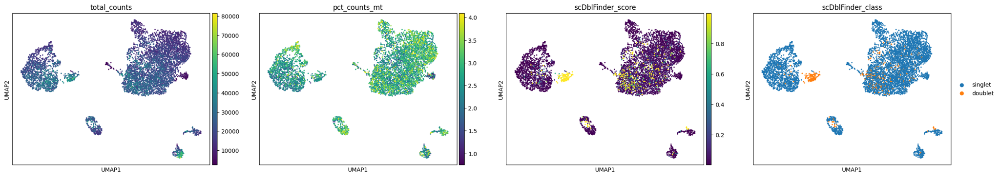

In [3]:
# Plot QC metrics to identify low-quality clusters
sc.pl.umap(
    adata,
    color=["total_counts", "pct_counts_mt", "scDblFinder_score", "scDblFinder_class"],
)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


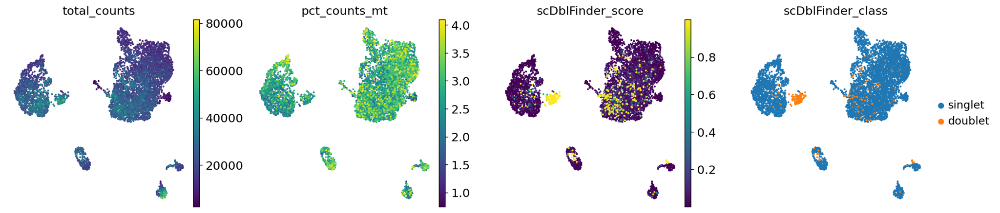

In [15]:
# Plot QC metrics to identify low-quality clusters
sc.pl.umap(
    adata,
    color=["total_counts", "pct_counts_mt", "scDblFinder_score", "scDblFinder_class"],
)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


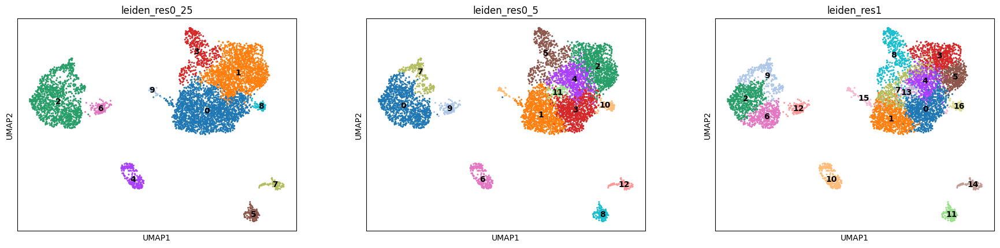

In [2]:
sc.pl.umap(
    adata,
    color=["leiden_res0_25", "leiden_res0_5", "leiden_res1"],
    legend_loc="on data",
)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


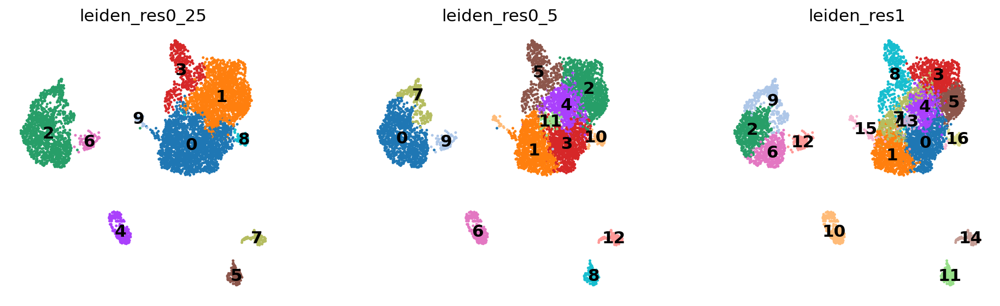

In [16]:
sc.pl.umap(
    adata,
    color=["leiden_res0_25", "leiden_res0_5", "leiden_res1"],
    legend_loc="on data",
)

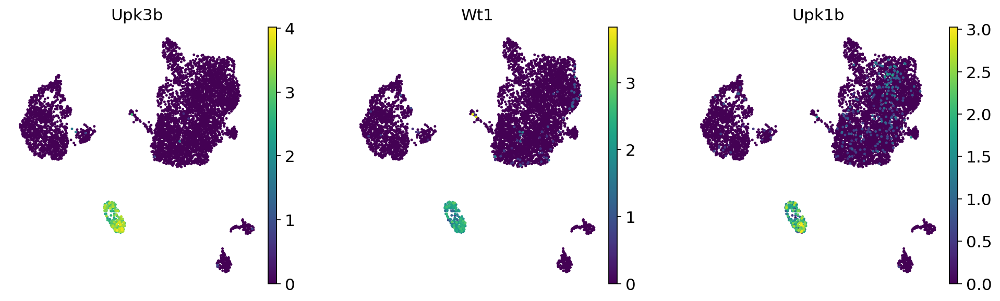

In [18]:
# Plot mesothelial markers to identify the cluster containing the lung mesothelium
sc.pl.umap(
    adata,
    color=["Upk3b",'Wt1','Upk1b'],
    legend_loc="on data",
)

In [3]:
# Remove clusters of doublets and low-quality cells 
adata2=adata[-adata.obs['leiden_res0_25'].isin(['6','8'])]
adata2

View of AnnData object with n_obs × n_vars = 5806 × 17207
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'size_factors', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_res0_25_colors', 'leiden_res0_5_colors', 'leiden_res1_colors', 'neighbors', 'pca', 'scDblFinder_class_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'


In [4]:
####Merge clusters
import numpy as np
adata2.obs['leiden_res0_25'][adata2.obs['leiden_res0_25'].isin(['9','1'])]='0'
adata2.obs['leiden_res0_25']=adata2.obs['leiden_res0_25'].astype('str').astype('category')
### Reorder and rename the Leiden
adata2.obs['leiden_res0_25'].cat.rename_categories(np.arange(len(np.unique(adata2.obs['leiden_res0_25']))).astype('str'), inplace=True)

/tmp/ipykernel_4127368/2389544354.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata2.obs['leiden_res0_25']=adata2.obs['leiden_res0_25'].astype('str').astype('category')
/tmp/ipykernel_4127368/2389544354.py:6: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  adata2.obs['leiden_res0_25'].cat.rename_categories(np.arange(len(np.unique(adata2.obs['leiden_res0_25']))).astype('str'), inplace=True)


/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


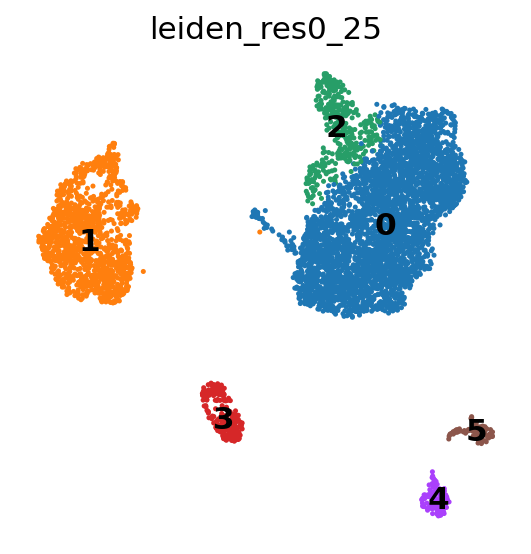

In [7]:
sc.pl.umap(adata2, color='leiden_res0_25', legend_loc='on data')

In [8]:
# create a dictionary to map cluster to annotation label
cluster2annotation = {
    "0": "Wnt2+ mesenchyme",
    "1": "AT2 cells",
    "2": "Smooth muscle cells",
    "3": "Mesothelium",
    "4": "Endothelial cells",
    '5': "T lymphocytes"
}

# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
adata2.obs["cell type"] = adata2.obs["leiden_res0_25"].map(cluster2annotation).astype("category")

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


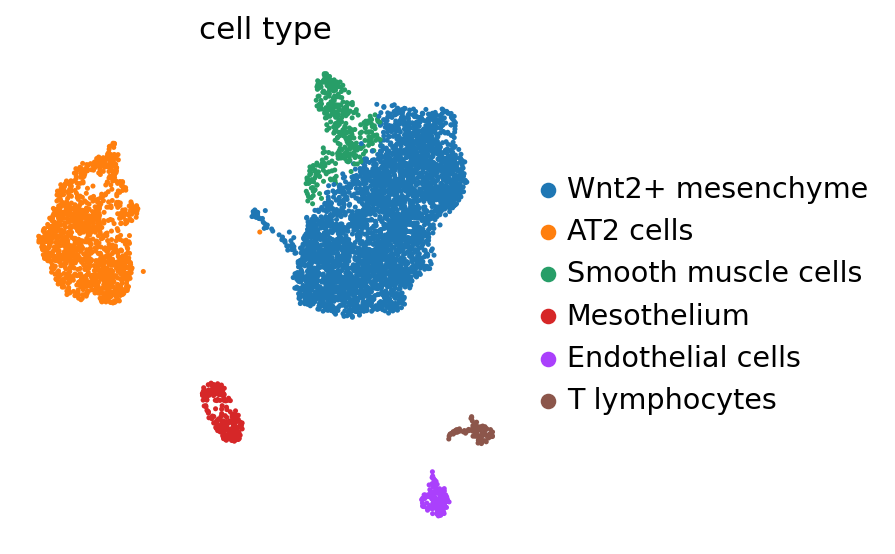

In [9]:
sc.pl.umap(
    adata2,
    color=['cell type']
)

In [15]:
marker_genes_dict = {
    "Wnt2+ mesenchyme": ["Wnt2","Snai2"],
    "AT2 cells": ["Sftpa1","Sftpc"],
    "Smooth muscle cells": ["Cnn1",'Myocd'],
    "Mesothelium": ['Upk3b','Wt1'],
    "Endothelial cells": ["Pecam1",'Icam2','Cldn5'],
    "T lymphocytes": ["Lcp1","Coro1a"]
}

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


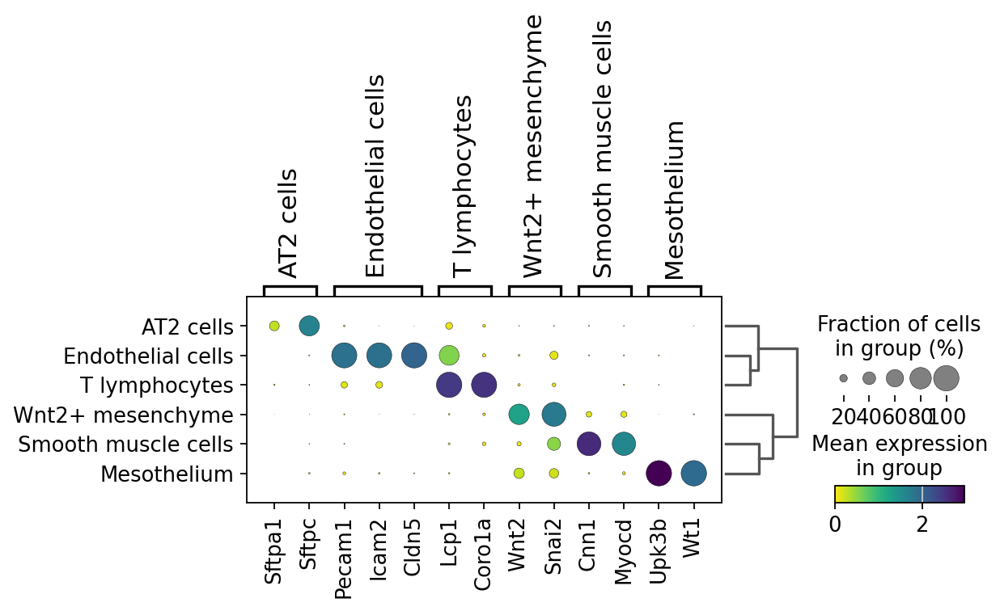

In [16]:
sc.pl.dotplot(adata2, marker_genes_dict, groupby="cell type", layer='log1p_norm', dendrogram=True,
              cmap="viridis_r")

# Below is the analysis of E13.5 pancreas. The pre-processing steps are identical to the workflow used for E13.5 lung so are not described here. 

In [40]:
adata = sc.read('e135_pancreas_clustered_final.h5ad')

/mnt/sdb/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


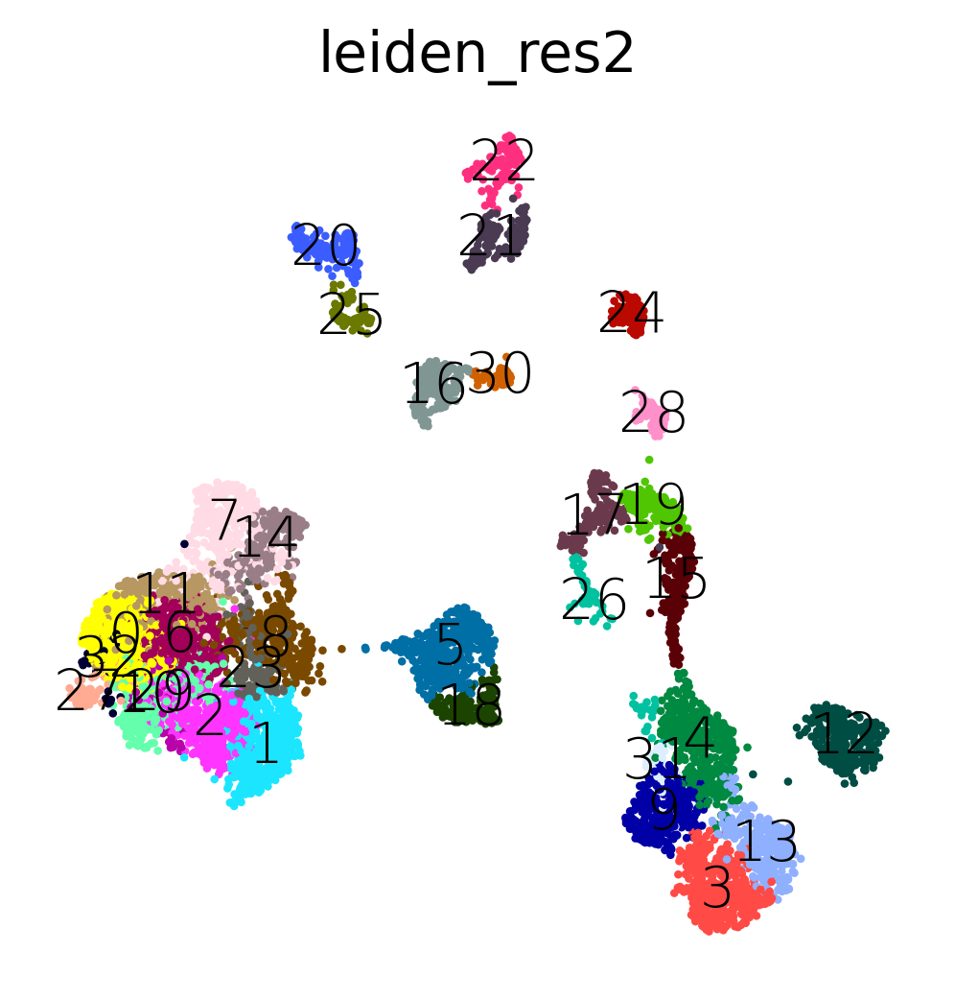

In [47]:
# Leiden clustering was performed and is visualised here
sc.pl.umap(
    adata,
    color=["leiden_res2"],
    legend_loc="on data",legend_fontweight='light'
)

In [48]:
####Merge clusters
import numpy as np
adata.obs['leiden_res2'][adata.obs['leiden_res2'].isin(['2','8','23','1','11','6','32','27','10','29'])]='0'
adata.obs['leiden_res2'][adata.obs['leiden_res2'].isin(['31','9'])]='4'
adata.obs['leiden_res2']=adata.obs['leiden_res2'].astype('str').astype('category')
### Reorder and rename the Leiden
adata.obs['leiden_res2'].cat.rename_categories(np.arange(len(np.unique(adata.obs['leiden_res2']))).astype('str'), inplace=True)

/tmp/ipykernel_2288796/1360744179.py:7: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  adata.obs['leiden_res2'].cat.rename_categories(np.arange(len(np.unique(adata.obs['leiden_res2']))).astype('str'), inplace=True)


/mnt/sdb/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


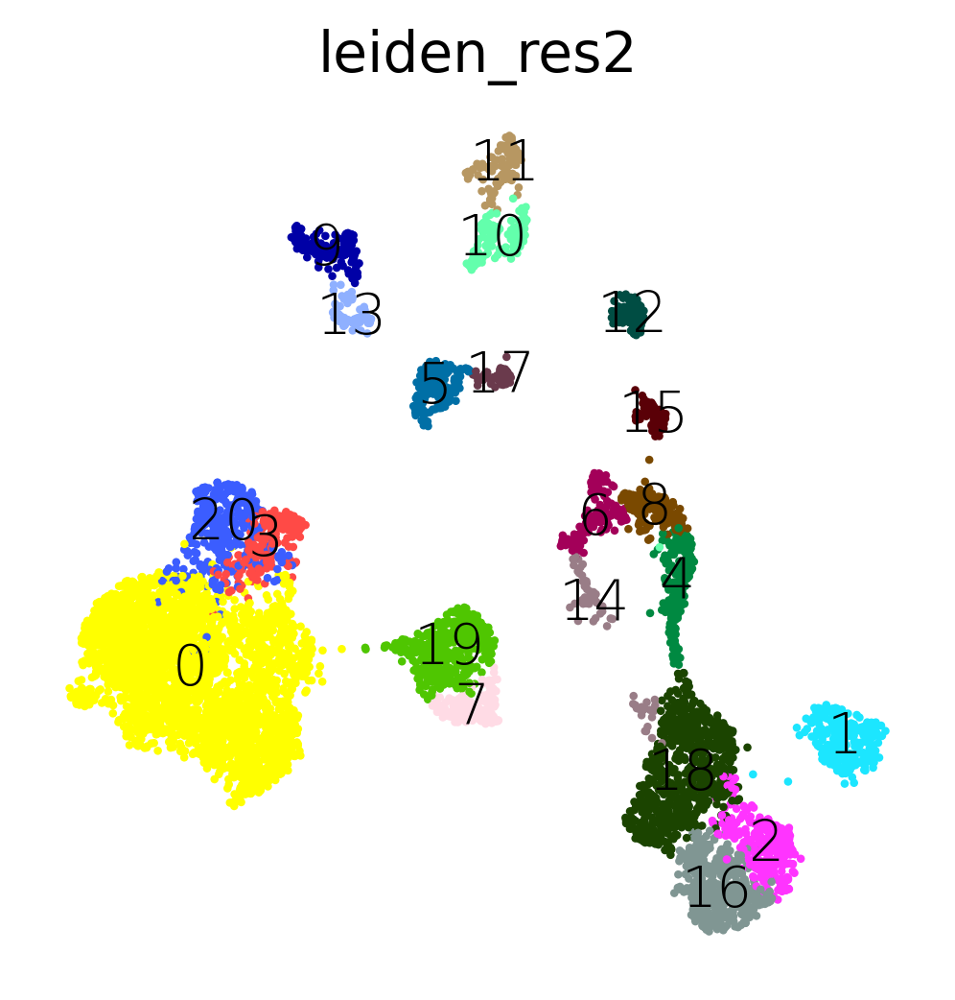

In [49]:
sc.pl.umap(
    adata,
    color=["leiden_res2"],
    legend_loc="on data",legend_fontweight='light'
)

In [50]:
####Merge clusters round 2
import numpy as np
adata.obs['leiden_res2'][adata.obs['leiden_res2']=='20']='3'
adata.obs['leiden_res2'][adata.obs['leiden_res2']=='19']='7'
adata.obs['leiden_res2'][adata.obs['leiden_res2']=='16']='2'
adata.obs['leiden_res2'][adata.obs['leiden_res2']=='14']='6'
adata.obs['leiden_res2'][adata.obs['leiden_res2']=='11']='10'
adata.obs['leiden_res2'][adata.obs['leiden_res2']=='17']='5'
adata.obs['leiden_res2'][adata.obs['leiden_res2']=='13']='9'
adata.obs['leiden_res2']=adata.obs['leiden_res2'].astype('str').astype('category')
### Reorder and rename the Leiden
adata.obs['leiden_res2'].cat.rename_categories(np.arange(len(np.unique(adata.obs['leiden_res2']))).astype('str'), inplace=True)

/tmp/ipykernel_2288796/3896579357.py:12: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  adata.obs['leiden_res2'].cat.rename_categories(np.arange(len(np.unique(adata.obs['leiden_res2']))).astype('str'), inplace=True)


/mnt/sdb/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


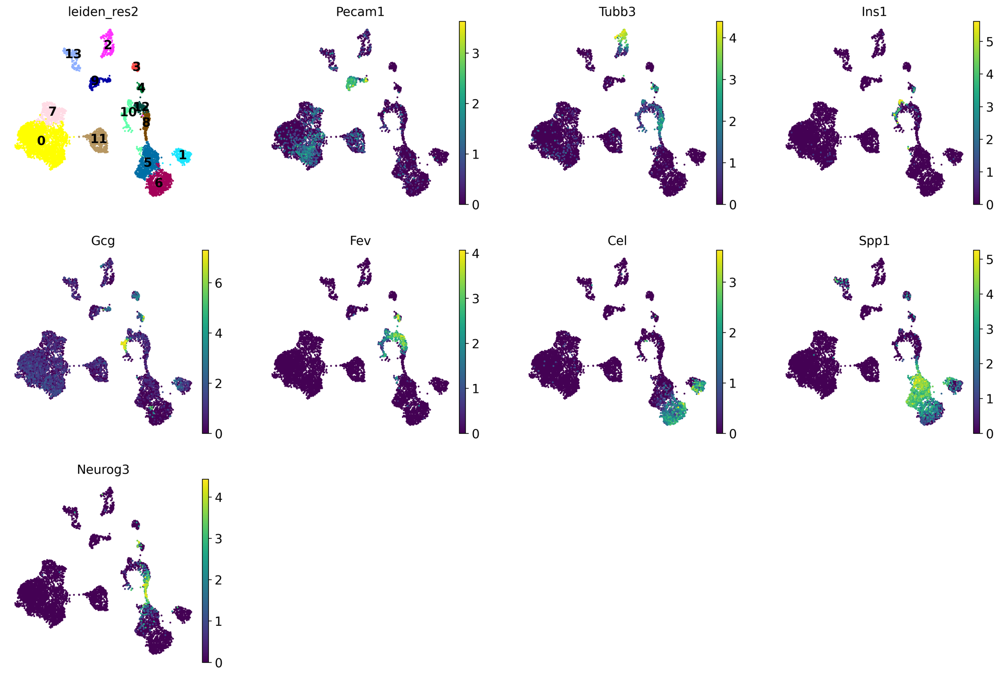

In [52]:
# Visualise cell markers
sc.pl.umap(
    adata,
    color=["leiden_res2",'Pecam1','Tubb3','Ins1','Gcg','Fev','Cel','Spp1','Neurog3'],
    legend_loc="on data",
)

In [66]:
# create a dictionary to map cluster to annotation label
cluster2annotation = {
    "0": "Quiescent stellate cells",
    "7": "Activated stellate cells",
    "11": "Mesothelium",
    "9": "Islet endothelium",
    "2": "Neural crest",
    "13": "Neutrophils",
    '3': "T lymphocytes",
    '10': "Endocrine",
    '12':"Fev+ cells",
    '8':"Endocrine progenitors",
    '5':"Ductal",
    '6':"Acinar",
    '1':"Acinar 2",
    '4':"Endocrine 2",
    
}

# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
adata.obs["cell type"] = adata.obs["leiden_res2"].map(cluster2annotation).astype("category")

/mnt/sdb/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


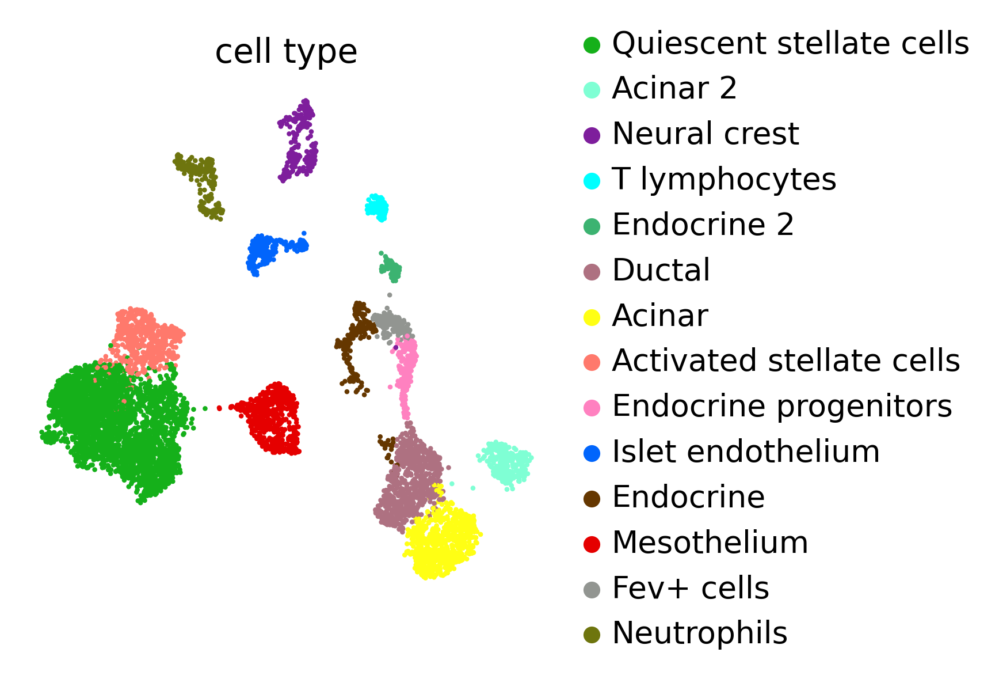

In [32]:
sc.pl.umap(
    adata,
    color=["cell type"],
    palette={"Quiescent stellate cells": "xkcd:green", "Mesothelium": "xkcd:red", "Activated stellate cells":"xkcd:salmon",
            "T lymphocytes":"xkcd:cyan", "Islet endothelium":"xkcd:bright blue","Neutrophils":"xkcd:olive","Neural crest":"xkcd:purple",
            "Ductal":'xkcd:mauve',"Acinar":"xkcd:yellow","Endocrine":"xkcd:brown","Fev+ cells":"xkcd:grey","Endocrine progenitors":"xkcd:pink",
            "Acinar 2":"Aquamarine",'Endocrine 2':"mediumseagreen"}
)

In [5]:
marker_genes_dict = {
    "Mesothelium": ['Upk3b','Wt1'],
    "Quiescent stellate cells": ["Des"],
    "Activated stellate cells": ["Des","Mki67"],
    "T lymphocytes": ["Lcp1","Coro1a"],
    "Islet endothelium": ["Pecam1",'Fabp4'],
    "Neutrophils":["Srgn"],
    "Ductal":['Spp1'],
    "Acinar":['Cpa1','Cel'],
    "Neural crest": ["Alk",'Dlx2'],
    "Endocrine progenitors":["Neurog3"],
        "Endocrine": ["Ins1"],
        "Fev+ cells":["Fev"],
}

/mnt/sdb/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


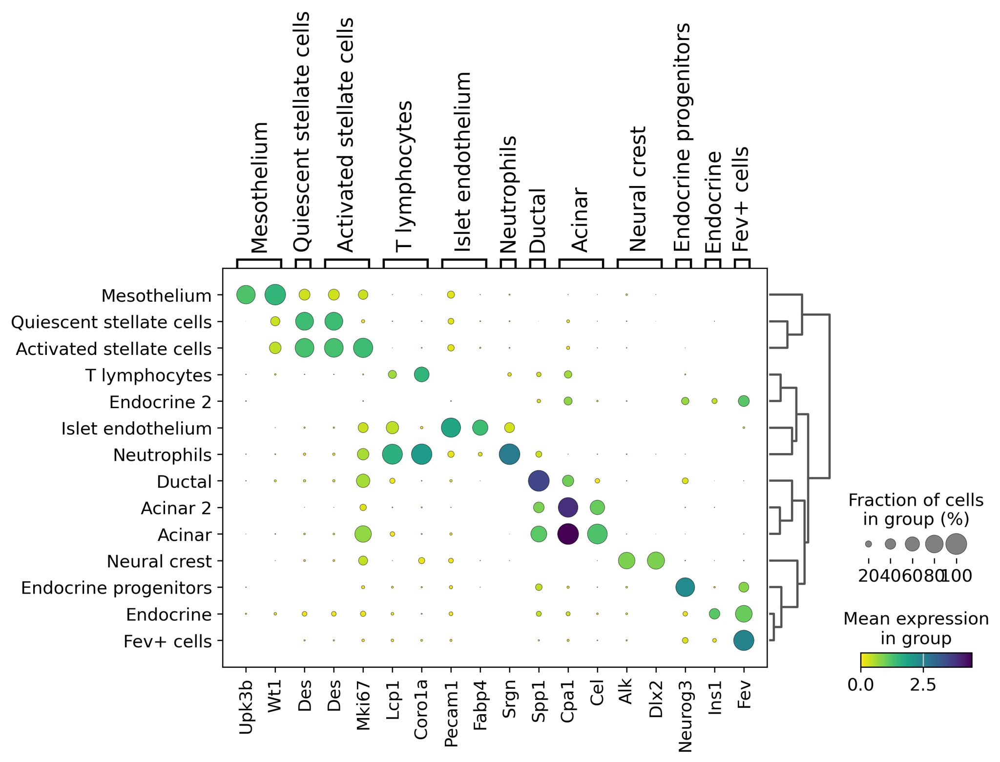

In [8]:
sc.pl.dotplot(adata, marker_genes_dict, groupby="cell type", layer='log1p_norm', dendrogram=True,
              cmap="viridis_r")

# Analyze E12.5, E14.5 and E17.5 scRNA-seq pancreas from this paper: https://www.nature.com/articles/s41467-018-06176-3. The processing for the E12.5 sample is demonstrated here.  

In [9]:
### The script below is to convert the names of the mtx file in the dataset from {prefx}_genes.tsv.gz to {prefix}_features.tsv.gz

import gzip
import os

# Directory containing your files (default is current working directory)
input_dir = "."  # Change this if your files are elsewhere

# Loop through all files in the directory ending with _genes.tsv.gz
for filename in os.listdir(input_dir):
    if filename.endswith("_genes.tsv.gz"):
        prefix = filename.replace("_genes.tsv.gz", "")
        print(f"🔄 Processing file: {filename}")

        input_genes_file = os.path.join(input_dir, filename)
        output_features_file = os.path.join(input_dir, f"{prefix}_features.tsv.gz")

        # Process and write new features file
        with gzip.open(input_genes_file, 'rt', encoding='utf-8') as fin, \
             gzip.open(output_features_file, 'wt', encoding='utf-8') as fout:

            for line in fin:
                line = line.rstrip()
                if not line:
                    continue

                parts = line.split('\t')
                if len(parts) == 1:
                    # Only gene ID present; assume gene name = gene ID
                    fout.write(f"{parts[0]}\t{parts[0]}\tGene Expression\n")
                elif len(parts) >= 2:
                    # gene_id and gene_name already exist; add "Gene Expression"
                    fout.write(f"{parts[0]}\t{parts[1]}\tGene Expression\n")
                else:
                    # Shouldn't happen — just copy line
                    fout.write(f"{line}\n")

        print(f"✅ Saved: {output_features_file}")

🔄 Processing file: GSM2699156_E12_B2_genes.tsv.gz
✅ Saved: ./GSM2699156_E12_B2_features.tsv.gz
🔄 Processing file: GSM3140916_E14_v2_genes.tsv.gz
✅ Saved: ./GSM3140916_E14_v2_features.tsv.gz
🔄 Processing file: GSM2699155_E14_B2_genes.tsv.gz
✅ Saved: ./GSM2699155_E14_B2_features.tsv.gz
🔄 Processing file: GSM3140917_E17_1_v2_genes.tsv.gz
✅ Saved: ./GSM3140917_E17_1_v2_features.tsv.gz
🔄 Processing file: GSM3140918_E17_2_v2_genes.tsv.gz
✅ Saved: ./GSM3140918_E17_2_v2_features.tsv.gz
🔄 Processing file: GSM3140915_E12_v2_genes.tsv.gz
✅ Saved: ./GSM3140915_E12_v2_features.tsv.gz
🔄 Processing file: GSM2699157_E17_B2_genes.tsv.gz
✅ Saved: ./GSM2699157_E17_B2_features.tsv.gz


In [10]:
### The script below is to convert the names of the mtx file in the dataset from {prefx}.mtx.tsv.gz to {prefix}_matrix.tsv.gz
# Set the directory containing your .mtx.gz files
directory = "."  # Change this path if needed

# Loop through all files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".mtx.gz"):
        # Remove the old extension to get base name
        base_name = filename.replace(".mtx.gz", "")
        
        # Create new filename
        new_filename = f"{base_name}_matrix.mtx.gz"
        
        # Build full paths
        old_path = os.path.join(directory, filename)
        new_path = os.path.join(directory, new_filename)
        
        # Rename the file
        os.rename(old_path, new_path)
        print(f"✅ Renamed: {filename} → {new_filename}")

✅ Renamed: GSM2699156_E12_B2.mtx.gz → GSM2699156_E12_B2_matrix.mtx.gz
✅ Renamed: GSM3140916_E14_v2.mtx.gz → GSM3140916_E14_v2_matrix.mtx.gz
✅ Renamed: GSM3140918_E17_2_v2.mtx.gz → GSM3140918_E17_2_v2_matrix.mtx.gz
✅ Renamed: GSM2699154_E14_B1_matrix.mtx.gz → GSM2699154_E14_B1_matrix_matrix.mtx.gz
✅ Renamed: GSM3140915_E12_v2.mtx.gz → GSM3140915_E12_v2_matrix.mtx.gz
✅ Renamed: GSM2699157_E17_B2.mtx.gz → GSM2699157_E17_B2_matrix.mtx.gz
✅ Renamed: GSM3140917_E17_1_v2.mtx.gz → GSM3140917_E17_1_v2_matrix.mtx.gz
✅ Renamed: GSM2699155_E14_B2.mtx.gz → GSM2699155_E14_B2_matrix.mtx.gz


In [3]:
# Read the 10X mtx file
adata = sc.read_10x_mtx(
    path="/mnt/sdb/qdang/meso_project/sc_rna",prefix='GSM3140915_E12_v2_', cache=True, var_names='gene_symbols'
)
adata

AnnData object with n_obs × n_vars = 13197 × 27998
    var: 'gene_ids', 'feature_types'

In [4]:
# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("mt-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("rps", "rpl"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains(("^hb[^(p)]"))

/mnt/sdb/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/seaborn/categorical.py:82: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


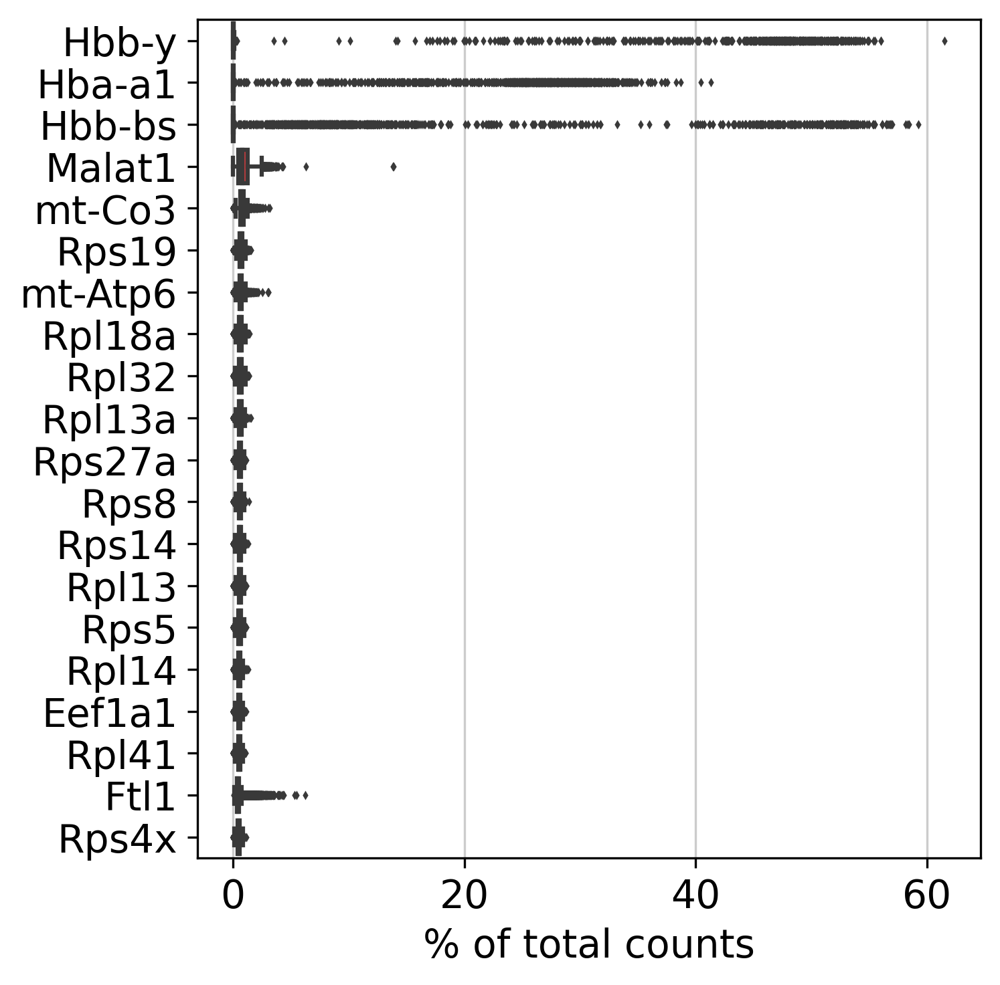

In [19]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [5]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
adata

AnnData object with n_obs × n_vars = 13197 × 27998
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

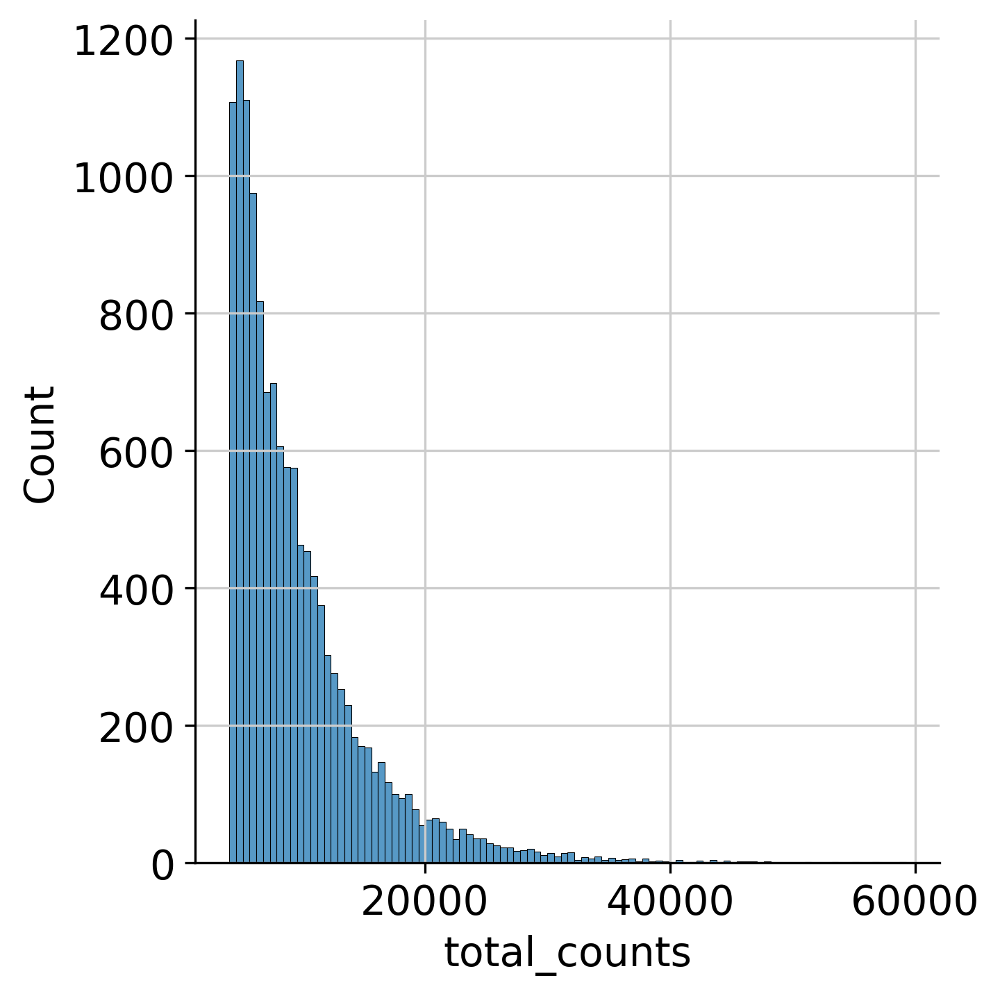

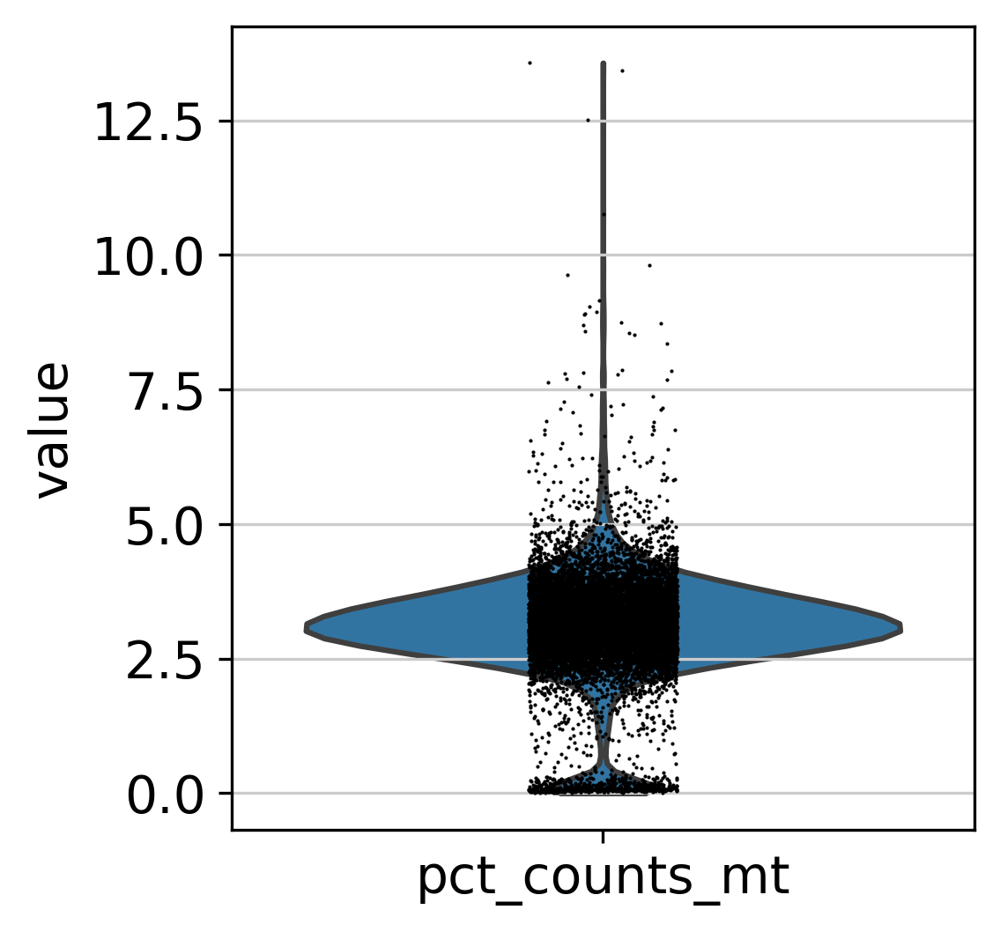

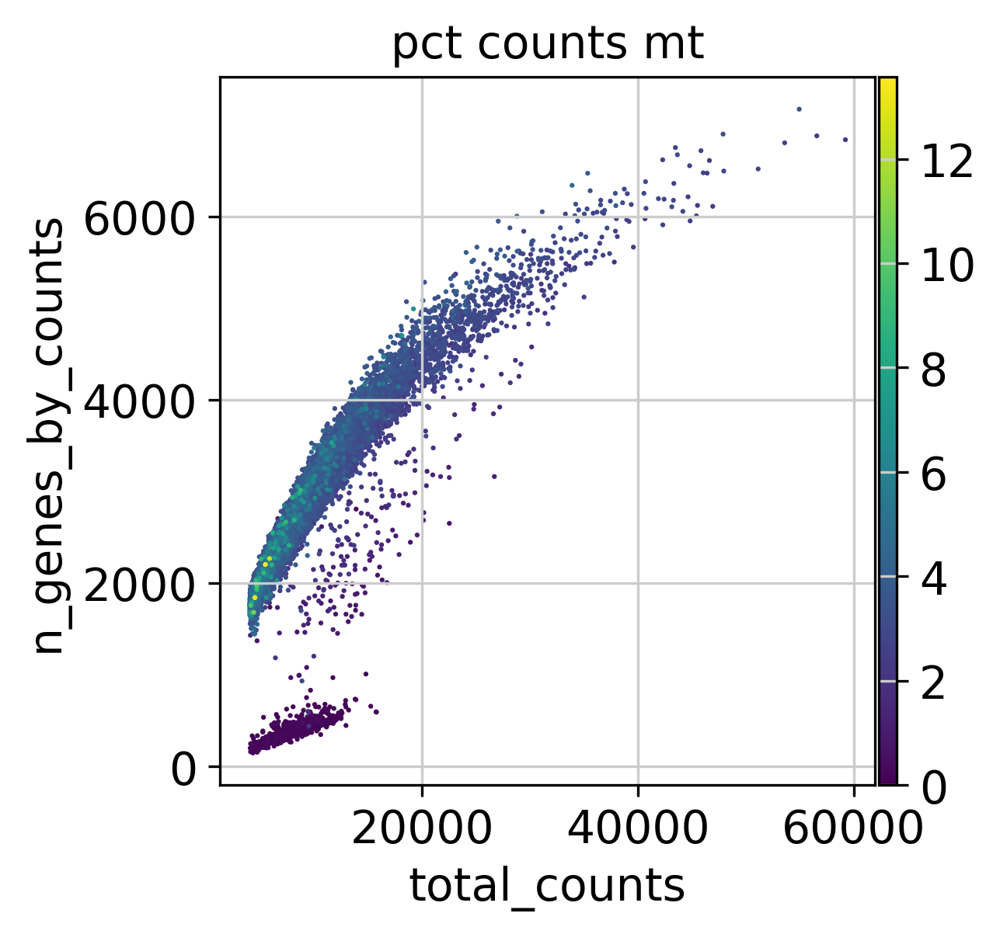

In [6]:
p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False)
# sc.pl.violin(adata, 'total_counts')
p2 = sc.pl.violin(adata, "pct_counts_mt")
p3 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [7]:
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [8]:
adata.obs["outlier"] = (
    is_outlier(adata, "log1p_total_counts", 5)
    | is_outlier(adata, "log1p_n_genes_by_counts", 5)
    | is_outlier(adata, "pct_counts_in_top_20_genes", 5)
)
adata.obs.outlier.value_counts()

False    12043
True      1154
Name: outlier, dtype: int64

In [9]:
# Set the percentage of mitochondrial read count outlier threshold to 8%, use this strategy or 3 MAD outlier detection
adata.obs["mt_outlier"] = is_outlier(adata, "pct_counts_mt", 3) | (
    adata.obs["pct_counts_mt"] > 8
)
adata.obs.mt_outlier.value_counts()

False    11831
True      1366
Name: mt_outlier, dtype: int64

In [10]:
print(f"Total number of cells: {adata.n_obs}")
adata = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")

Total number of cells: 13197
Number of cells after filtering of low quality cells: 11507


In [21]:
print(f"Total number of genes: {adata.n_vars}")

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print(f"Number of genes after cell filter: {adata.n_vars}")

Total number of genes: 27998
Number of genes after cell filter: 15775


In [22]:
%%R
library(Seurat)
library(scater)
library(scDblFinder)
library(BiocParallel)

Attaching SeuratObject
Loading required package: SingleCellExperiment
Loading required package: SummarizedExperiment
Loading required package: MatrixGenerics
Loading required package: matrixStats

Attaching package: 'MatrixGenerics'

The following objects are masked from 'package:matrixStats':

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedi

In [23]:
data_mat = adata.X.T

In [24]:
%%R -i data_mat -o doublet_score -o doublet_class

set.seed(123)
sce = scDblFinder(
    SingleCellExperiment(
        list(counts=data_mat),
    ) 
)
doublet_score = sce$scDblFinder.score
doublet_class = sce$scDblFinder.class

Creating ~9206 artificial doublets...
Dimensional reduction
Evaluating kNN...
Training model...
iter=0, 2149 cells excluded from training.
iter=1, 2153 cells excluded from training.
iter=2, 2100 cells excluded from training.
Threshold found:0.488
1748 (15.2%) doublets called


In [25]:
adata.obs["scDblFinder_score"] = doublet_score
adata.obs["scDblFinder_class"] = doublet_class
adata.obs.scDblFinder_class.value_counts()

singlet    9759
doublet    1748
Name: scDblFinder_class, dtype: int64

# Below, we integrate scRNA-seq datasets spanning embryonic pancreas development. We included E12.5, E13.5, E14.5, and E17.5 sRNA-seq generated from two independent studies

In [1]:
import scanpy as sc
import scvi
import bbknn
import scib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import anndata as ad
from anndata import AnnData
import seaborn as sns
import celltypist
import anndata as ad
from celltypist import models
from scipy.stats import median_abs_deviation


sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=150,
    dpi_save=700,
    facecolor="white",
    frameon=False,
)

# R interface
from rpy2.robjects import pandas2ri
from rpy2.robjects import r
import rpy2.rinterface_lib.callbacks
import anndata2ri

pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
2025-05-19 05:47:04.879745: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-19 05:47:04.879767: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-19 05:47:04.881826: E external/

In [2]:
import os
import anndata as ad
os.chdir('/mnt/sdb/qdang/meso_project/sc_rna')

In [3]:
# Import anndata objects. These files have already been quality controlled to flag doublets
e125 = sc.read("e125_pancreas_quality_control.h5ad")
e135 = sc.read("/mnt/sdb/qdang/singlecell/mesothelium/pancreas/RNA/PMID_36881507_embryoatlas/e135_pancreas_quality_control.h5ad")
e145 = sc.read("e145_pancreas_quality_control.h5ad")
e175_1 = sc.read("e175_1_pancreas_quality_control.h5ad")
e175_2 = sc.read("e175_2_pancreas_quality_control.h5ad")

In [4]:
### Concatenate the datasets
adatas = {"E12.5": e125, "E14.5": e145, "E13.5": e135, "E17.5 rep 1": e175_1, "E17.5 rep 2": e175_2}
adatas = ad.concat(adatas, label="stage", join="outer")
adatas

AnnData object with n_obs × n_vars = 41671 × 20311
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'stage'
    layers: 'counts', 'soupX_counts'

In [5]:
# Make barcode and gene names unique after concatenation. We further filter out cells that don't express a minimum of 200 genes. 
adatas.obs_names_make_unique()
adatas.var_names_make_unique()
sc.pp.filter_cells(adatas, min_genes=200)

In [7]:
###We  will perform data normalisation using the shifted logarithm approach. We select this approach as it is recommended for ###
###variance-stabilising performances which is well-suited###
###for integration tasks: https://www.nature.com/articles/s41592-021-01336-8. Other normalisation methods may also be applicable, including scran normalisation###
scales_counts = sc.pp.normalize_total(adatas, target_sum=None, inplace=False)
# log1p transform
adatas.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

In [10]:
###As the integrated dataset is comprised of several independent batches, we will perform feature selection in a batch-aware manner. We use the scanpy ###
###implementation of this strategy, providing the batch key, and selecting the 5000 top genes. The number of top genes may vary depending on computational###
###resources available and may be informed by identifying how many genes were variable in how many batches, as seen below.### 
sc.pp.highly_variable_genes(
    adatas, n_top_genes=5000, flavor="cell_ranger", batch_key='stage'
)
adatas.var

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for mor

,n_cells,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection
0610005C13Rik,25,False,0.000303,0.114004,-0.023334,0,False
0610007P14Rik,18609,False,0.463186,0.405333,-0.165990,0,False
0610009B22Rik,17670,False,0.385249,0.562379,-0.001202,0,False
0610009E02Rik,1365,False,0.018286,0.116122,-0.126120,0,False
0610009L18Rik,2855,False,0.047381,0.731988,0.375558,2,False
...,...,...,...,...,...,...,...
mt-Nd3,22356,False,0.612835,0.482878,-0.537674,0,False
mt-Nd4,37395,False,2.447016,0.161259,-1.407339,0,False
mt-Nd4l,19341,False,0.827619,0.517820,-0.860477,0,False
mt-Nd5,31075,False,1.051819,0.374233,-0.320661,0,False


0    10626
1     3539
5     1901
2     1872
3     1280
4     1093
Name: highly_variable_nbatches, dtype: int64

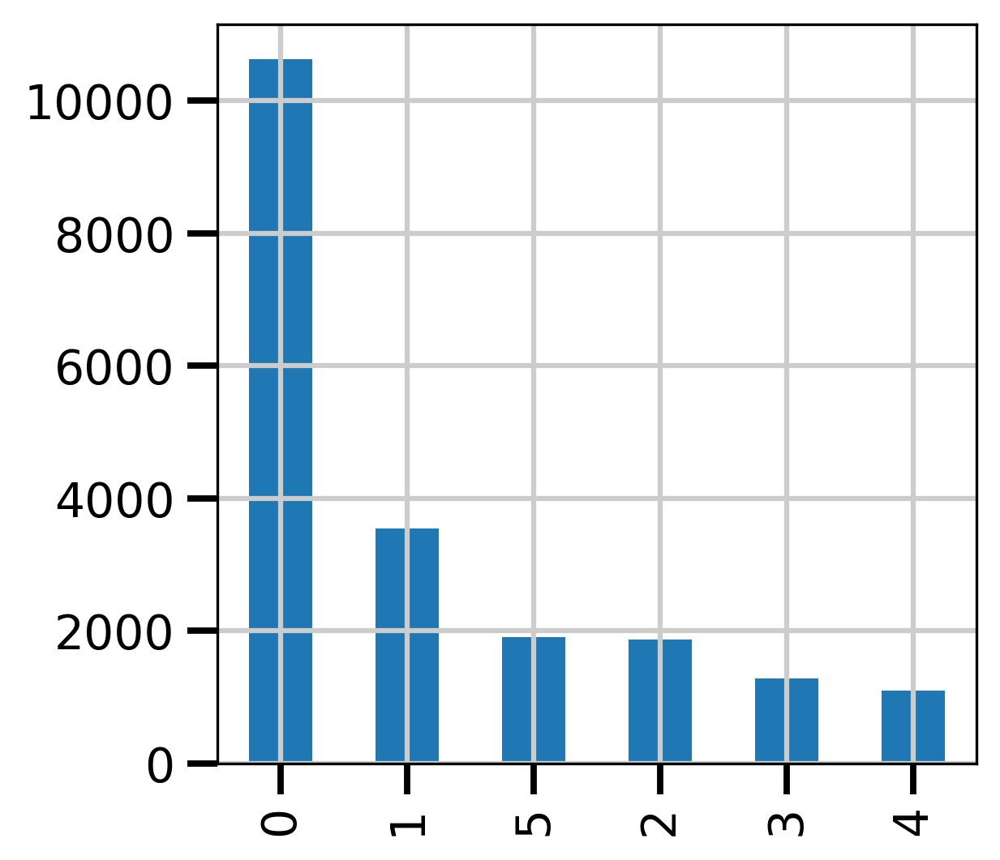

In [11]:
###Visualise the number of genes that vary across different number of batches
n_batches = adatas.var["highly_variable_nbatches"].value_counts()
ax = n_batches.plot(kind="bar")
n_batches

In [14]:
####Integration algorithms benefit from restricting to only highly variable genes (HVGs). We will subset the anndata object to only HVGs.##
###However, to retain the full gene list for post-integration queries, copy anndata attributes to .raw. ###
###Ensure that the raw, soupX-corrected counts are copied over. ###
adatas.X = adatas.layers['soupX_counts'].copy()
adatas.raw = adatas
adata_hvg = adatas[:, adatas.var["highly_variable"]].copy()
adata_hvg

AnnData object with n_obs × n_vars = 38626 × 5000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'stage', 'n_genes'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg'
    layers: 'counts', 'soupX_counts', 'log1p_norm'

In [15]:
# ###After saving soupX-corrected counts to the .raw layer, populate the .X layer with log+1-normalised counts for dimensionality reduction and clustering
adatas.X = adatas.layers["log1p_norm"]

In [16]:
####Perform dimensionality reduction by constructing a neighborhood graph and performing UMAP
sc.pp.pca(adatas, svd_solver="arpack", use_highly_variable=True)
sc.pp.neighbors(adatas)
sc.tl.umap(adatas)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/pynndescent/pynndescent_.py:346: NumbaPendingDeprecationWarning: Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced by 'new_style' in a future release. See details at https://numba.readthedocs.io/en/latest/reference/deprecation.html#deprecation-of-old-style-numba-captured-errors
Exception origin:
  File "/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/numba/core/types/functions.py", line 486, in __getnewargs__
    raise ReferenceError("underlying object has vanished")

  init_rp_tree(data, dist, current_graph, leaf_array)
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/pynndescent/pynndescent_.py:348: NumbaPendingDeprecationWarning: Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced by 'new_style' in a future release. See details at https://numba.readthedo

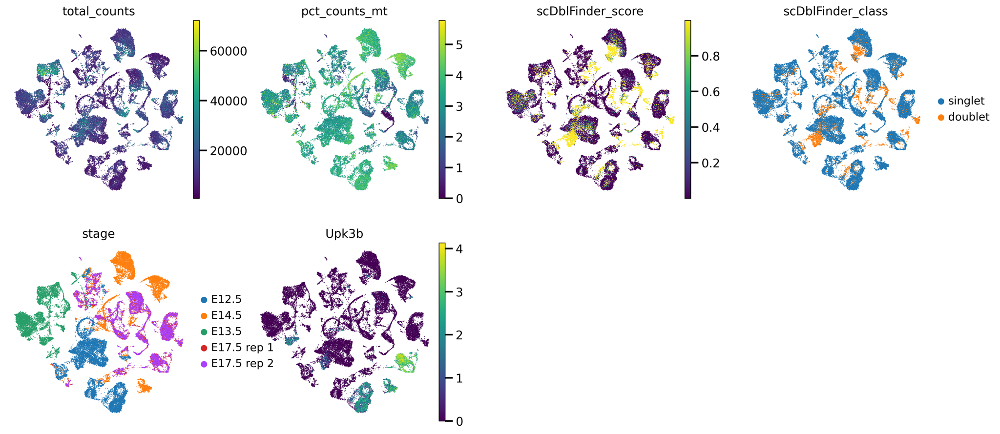

In [17]:
sc.pl.umap(
    adatas,
    color=["total_counts", "pct_counts_mt", "scDblFinder_score", "scDblFinder_class",'stage','Upk3b'],
    layer='log1p_norm'
)

In [19]:
# remove doublets
adata_nodbl = adatas[-adatas.obs["scDblFinder_class"].isin(["doublet"])]
adata_nodbl

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


View of AnnData object with n_obs × n_vars = 33841 × 20311
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'stage', 'n_genes'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'scDblFinder_class_colors', 'stage_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'soupX_counts', 'log1p_norm'
    obsp: 'distances', 'connectivities'

In [20]:
adata = adata_nodbl.copy()

In [21]:
# Perform integration using scVI
import scvi

scvi.model.SCVI.setup_anndata(adata, layer="soupX_counts", batch_key="stage")
vae = scvi.model.SCVI(adata, gene_likelihood="nb", n_layers=2, n_latent=30)
vae.train()
adata.obsm["scVI"] = vae.get_latent_representation()

Unable to initialize backend 'rocm': NOT_FOUND: Could not find registered platform with name: "rocm". Available platform names are: CUDA
Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 236/236: 100%|██████████| 236/236 [21:30<00:00,  5.41s/it, v_num=1, train_loss_step=7.62e+3, train_loss_epoch=7.4e+3] 

`Trainer.fit` stopped: `max_epochs=236` reached.


Epoch 236/236: 100%|██████████| 236/236 [21:30<00:00,  5.47s/it, v_num=1, train_loss_step=7.62e+3, train_loss_epoch=7.4e+3]


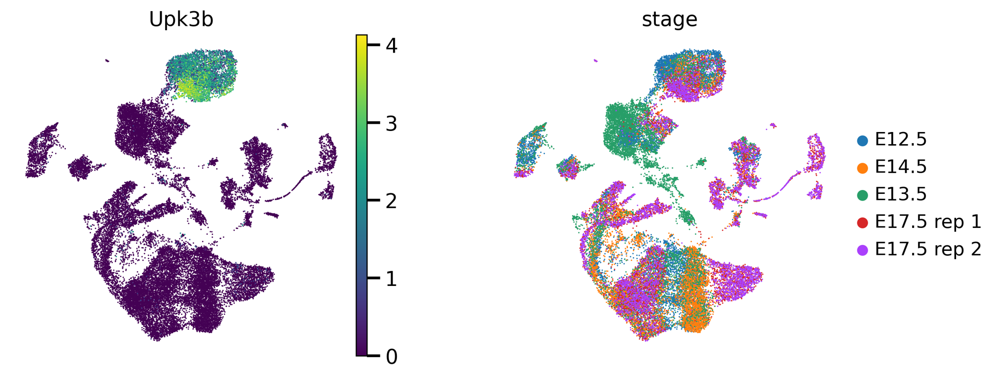

In [22]:
# Construct a new neighborhood graph using scVI-calculated latent embedding, then perform UMAP
sc.pp.neighbors(adata, use_rep="scVI")
sc.tl.umap(adata)
sc.pl.umap(adata, color=["Upk3b", 'stage'], layer='log1p_norm', wspace=0.3)

In [43]:
# Perform leiden clustering
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)
sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5)
sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


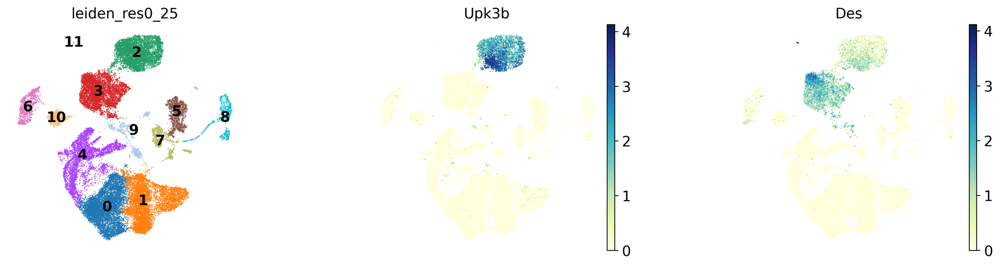

In [44]:
# We can see that the integration is very successful for mesothelial cells
sc.pl.umap(adata, color=['leiden_res0_25','Upk3b','Des'], wspace=0.4, layer='log1p_norm', legend_loc='on data')

In [45]:
# Filter out the mesothelium cluster. We have 5377 mesothelial cells in the integrated dataset 
meso = adata[adata.obs['leiden_res0_25'].isin(['2'])]
meso

View of AnnData object with n_obs × n_vars = 5377 × 20311
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'stage', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'neighbors', 'pca', 'scDblFinder_class_colors', 'stage_colors', 'umap', 'leiden', 'leiden_res0_25_colors'
    obsm: 'X_pca', 'X_umap', 'scVI'
    varm: 'PCs'
    layers: 'counts', 'log1p_norm', 'soupX_counts'
    obsp: 'connectivities', 'distances'

In [47]:
# Re-normalise the data after subsetting
scales_counts = sc.pp.normalize_total(epi, target_sum=None, inplace=False)
# log1p transform
epi.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [48]:
# Define mapping: original group → new group
group_mapping = {
    'E17.5 rep 1': 'E17.5',
    'E17.5 rep 2': 'E17.5',
    'E12.5': 'E12.5',
    'E13.5': 'E13.5',
    'E14.5': 'E14.5'
}

# Apply mapping to create new `.obs` column
epi.obs['batch'] = epi.obs['stage'].map(group_mapping).astype('category')

# Optional: Print counts to verify
print(epi.obs['batch'].value_counts())

E12.5    2670
E17.5    1409
E14.5     699
E13.5     599
Name: batch, dtype: int64


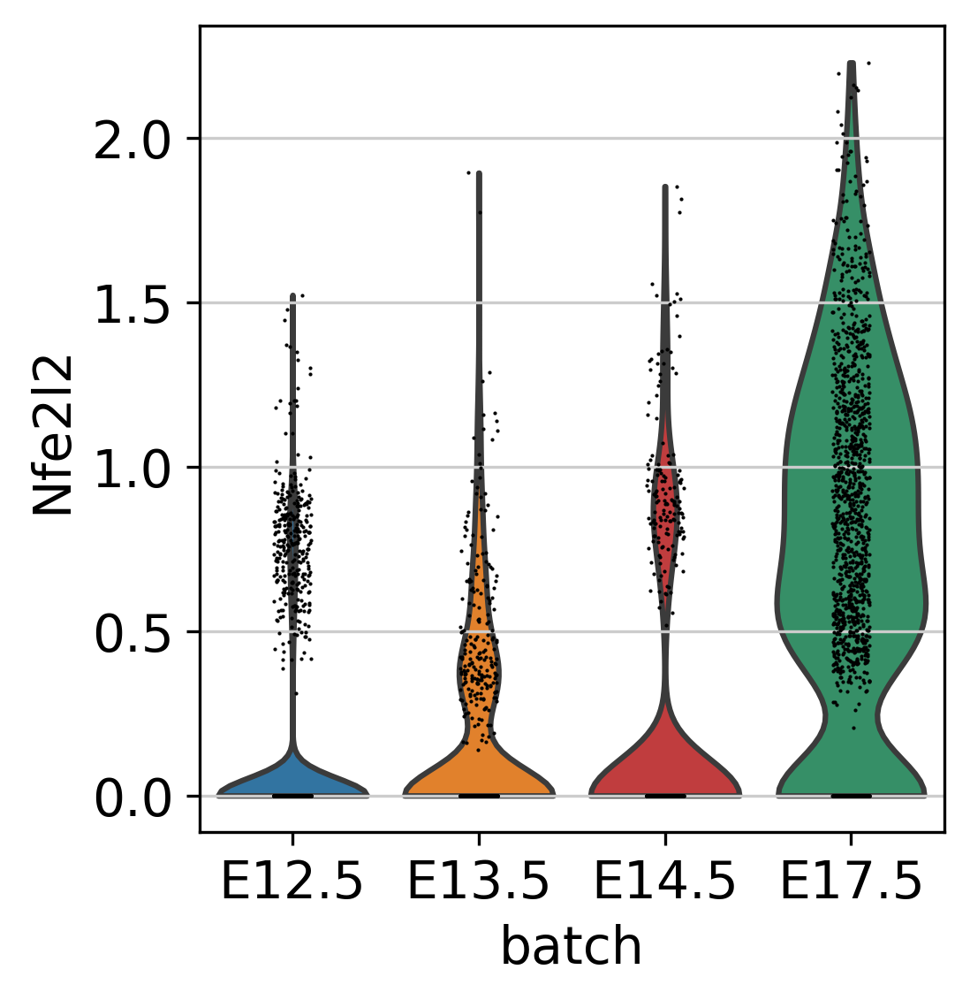

In [41]:
custom_palette = {
    'E17.5': '#279e68',
    'E12.5': '#1f77b4',
    'E13.5': '#ff7f0e',
    'E14.5': '#d62728'
}
sc.pl.violin(epi, ['Nfe2l2'],groupby='batch',layer='log1p_norm', use_raw=False, cmap='coolwarm', palette = custom_palette, save='Nfe2l2_pancreas_time.pdf')

# Integrate embryonic lung scRNA-seq datasets. We demonstrate the analysis workflow for the E12.5 sample. The rest were processed in an identical manner

## Analyze E12.5 samples

In [3]:
adata = sc.read_10x_h5(
    filename="GSM4504959_E12.5_filtered_gene_bc_matrices.h5",
)
adata

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 9792 × 27998
    var: 'gene_ids'

In [4]:
adata.var_names_make_unique()
adata

AnnData object with n_obs × n_vars = 9792 × 27998
    var: 'gene_ids'

In [5]:
# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("mt-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("rps", "rpl"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains("^hb[^(p)]")

In [6]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
adata

AnnData object with n_obs × n_vars = 9792 × 27998
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

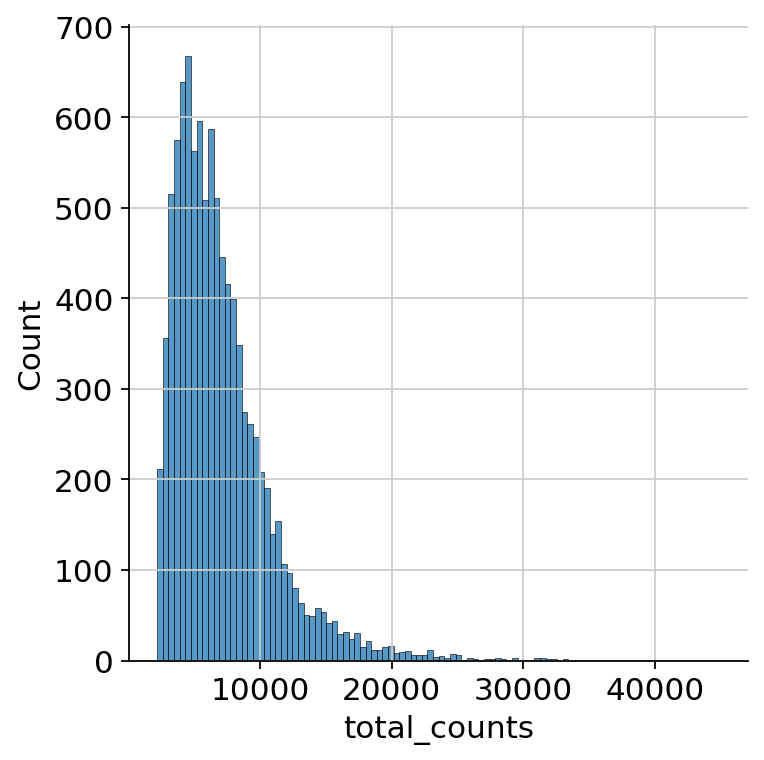

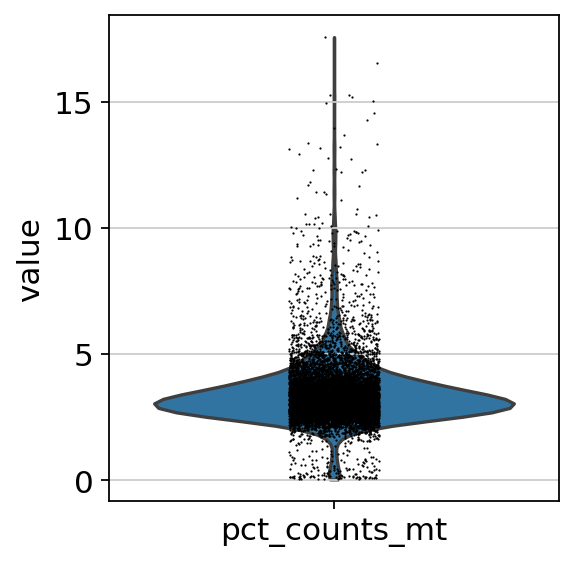

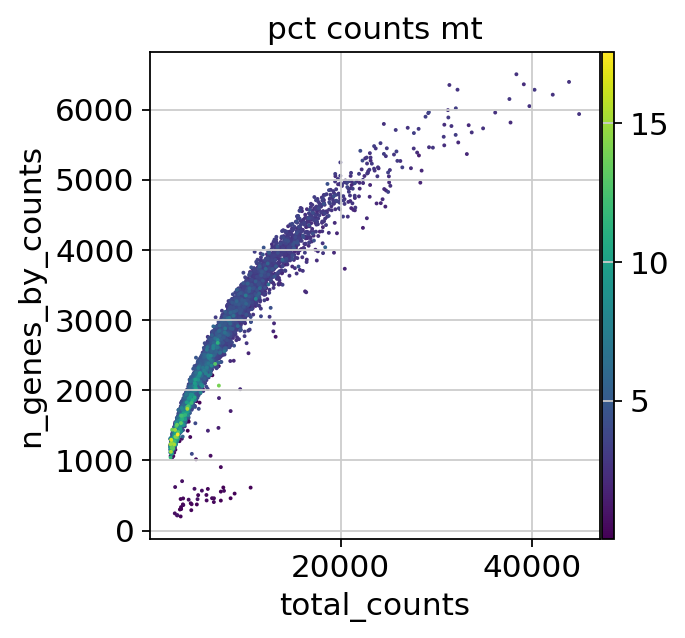

In [8]:
p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False)
# sc.pl.violin(adata, 'total_counts')
p2 = sc.pl.violin(adata, "pct_counts_mt")
p3 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [9]:
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [10]:
adata.obs["outlier"] = (
    is_outlier(adata, "log1p_total_counts", 5)
    | is_outlier(adata, "log1p_n_genes_by_counts", 5)
    | is_outlier(adata, "pct_counts_in_top_20_genes", 5)
)
adata.obs.outlier.value_counts()

False    9375
True      417
Name: outlier, dtype: int64

In [13]:
adata.obs["mt_outlier"] = is_outlier(adata, "pct_counts_mt", 3) | (
    adata.obs["pct_counts_mt"] > 15
)
adata.obs.mt_outlier.value_counts()

False    8737
True     1055
Name: mt_outlier, dtype: int64

In [14]:
print(f"Total number of cells: {adata.n_obs}")
adata = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")

Total number of cells: 9792
Number of cells after filtering of low quality cells: 8566


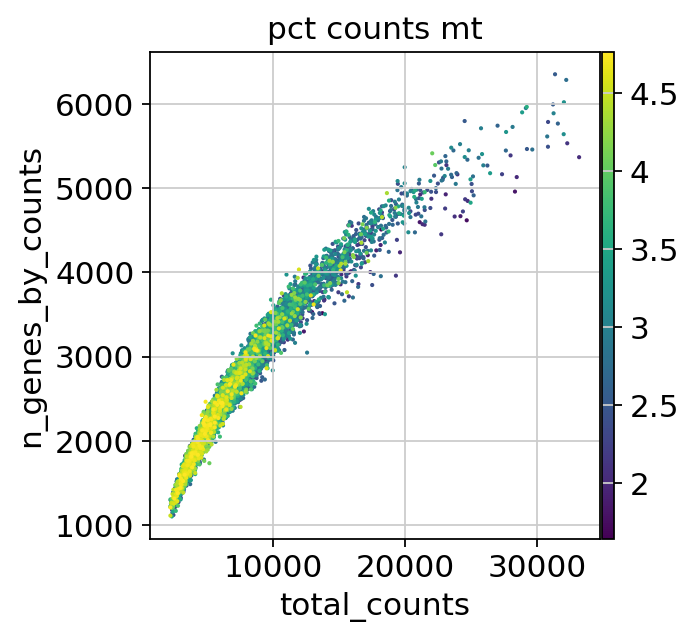

In [15]:
p1 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [16]:
import logging

import anndata2ri
import rpy2.rinterface_lib.callbacks as rcb
import rpy2.robjects as ro

rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

In [17]:
%%R
library(SoupX)


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

In [18]:
adata_pp = adata.copy()
sc.pp.normalize_per_cell(adata_pp)
sc.pp.log1p(adata_pp)

In [19]:
sc.pp.pca(adata_pp)
sc.pp.neighbors(adata_pp)
sc.tl.leiden(adata_pp, key_added="soupx_groups")

# Preprocess variables for SoupX
soupx_groups = adata_pp.obs["soupx_groups"]

2025-05-23 03:25:19.364854: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-23 03:25:19.644763: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-23 03:25:19.644817: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-23 03:25:19.648825: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-23 03:25:19.696627: I tensorflow/core/platform/cpu_feature_guar

In [20]:
print(adata.X)

  (0, 27920)	39.0
  (0, 27917)	13.0
  (0, 27914)	38.0
  (0, 27913)	36.0
  (0, 27911)	26.0
  (0, 27910)	7.0
  (0, 27909)	2.0
  (0, 27908)	28.0
  (0, 27903)	1.0
  (0, 27901)	1.0
  (0, 27898)	4.0
  (0, 27893)	3.0
  (0, 27886)	1.0
  (0, 27840)	1.0
  (0, 27837)	4.0
  (0, 27829)	1.0
  (0, 27827)	3.0
  (0, 27817)	9.0
  (0, 27804)	2.0
  (0, 27792)	1.0
  (0, 27787)	2.0
  (0, 27771)	5.0
  (0, 27766)	1.0
  (0, 27745)	2.0
  (0, 27739)	1.0
  :	:
  (8565, 532)	1.0
  (8565, 501)	11.0
  (8565, 499)	5.0
  (8565, 458)	1.0
  (8565, 443)	1.0
  (8565, 422)	1.0
  (8565, 417)	1.0
  (8565, 390)	1.0
  (8565, 377)	1.0
  (8565, 368)	4.0
  (8565, 341)	1.0
  (8565, 340)	1.0
  (8565, 329)	1.0
  (8565, 285)	2.0
  (8565, 236)	1.0
  (8565, 227)	4.0
  (8565, 208)	1.0
  (8565, 188)	1.0
  (8565, 130)	1.0
  (8565, 95)	1.0
  (8565, 68)	1.0
  (8565, 62)	7.0
  (8565, 51)	1.0
  (8565, 45)	2.0
  (8565, 37)	1.0


In [21]:
adata.layers["counts"] = adata.X

In [22]:
print(f"Total number of genes: {adata.n_vars}")

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print(f"Number of genes after cell filter: {adata.n_vars}")

Total number of genes: 27998
Number of genes after cell filter: 14087


In [23]:
%%R
library(Seurat)
library(scater)
library(scDblFinder)
library(BiocParallel)

Attaching SeuratObject
Loading required package: SingleCellExperiment
Loading required package: SummarizedExperiment
Loading required package: MatrixGenerics
Loading required package: matrixStats

Attaching package: 'MatrixGenerics'

The following objects are masked from 'package:matrixStats':

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedi

In [24]:
data_mat = adata.X.T

In [25]:
%%R -i data_mat -o doublet_score -o doublet_class

set.seed(123)
sce = scDblFinder(
    SingleCellExperiment(
        list(counts=data_mat),
    ) 
)
doublet_score = sce$scDblFinder.score
doublet_class = sce$scDblFinder.class

Creating ~6853 artificial doublets...
Dimensional reduction
Evaluating kNN...
Training model...
iter=0, 851 cells excluded from training.
iter=1, 799 cells excluded from training.
iter=2, 781 cells excluded from training.
Threshold found:0.433
764 (8.9%) doublets called


In [26]:
adata.obs["scDblFinder_score"] = doublet_score
adata.obs["scDblFinder_class"] = doublet_class
adata.obs.scDblFinder_class.value_counts()

singlet    7802
doublet     764
Name: scDblFinder_class, dtype: int64

In [27]:
adata.write("e125_quality_control.h5ad")

# Analyse P3 sample to match ATAC-seq

In [1]:
import numpy as np
import scanpy as sc
import seaborn as sns
from scipy.stats import median_abs_deviation

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    vector_friendly=False,
    dpi_save=700,
    facecolor="white",
    frameon=False,
)
import os
os.chdir('/mnt/sdb/qdang/meso_project/sc_rna/lung/PMID_33707239')

In [2]:
adata = sc.read_10x_h5(
    filename="GSM4504962_P3_filtered_gene_bc_matrices.h5",
)
adata

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 11905 × 27998
    var: 'gene_ids'

In [3]:
adata.var_names_make_unique()
adata

AnnData object with n_obs × n_vars = 11905 × 27998
    var: 'gene_ids'

In [4]:
# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("mt-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("rps", "rpl"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains("^hb[^(p)]")

In [5]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
adata

AnnData object with n_obs × n_vars = 11905 × 27998
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

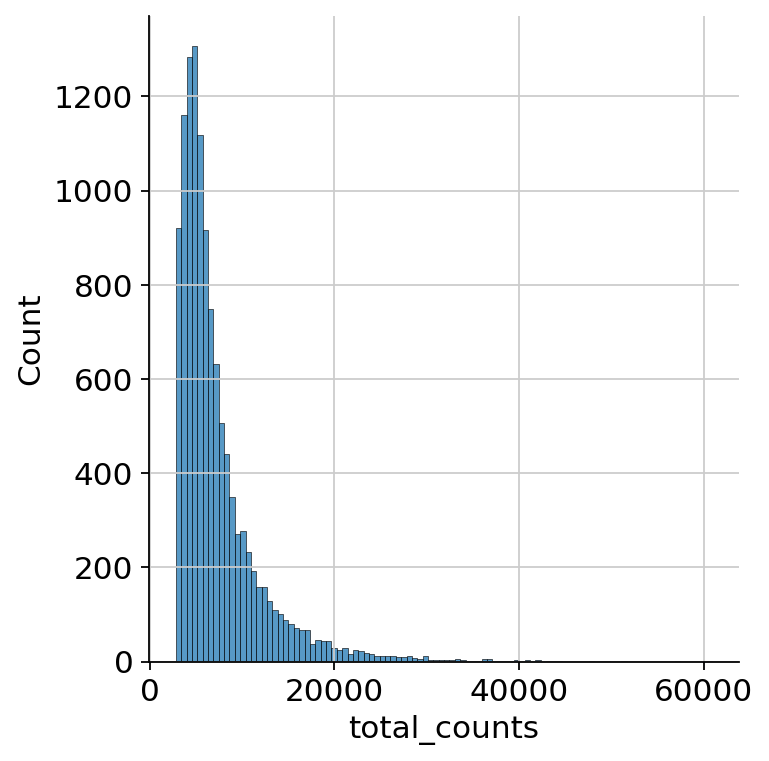

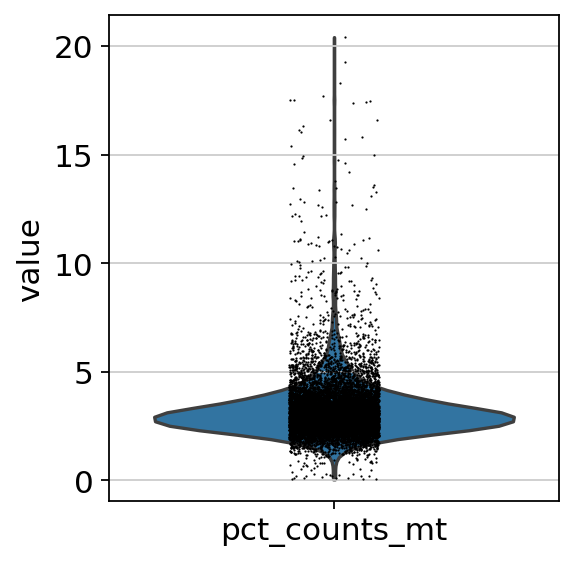

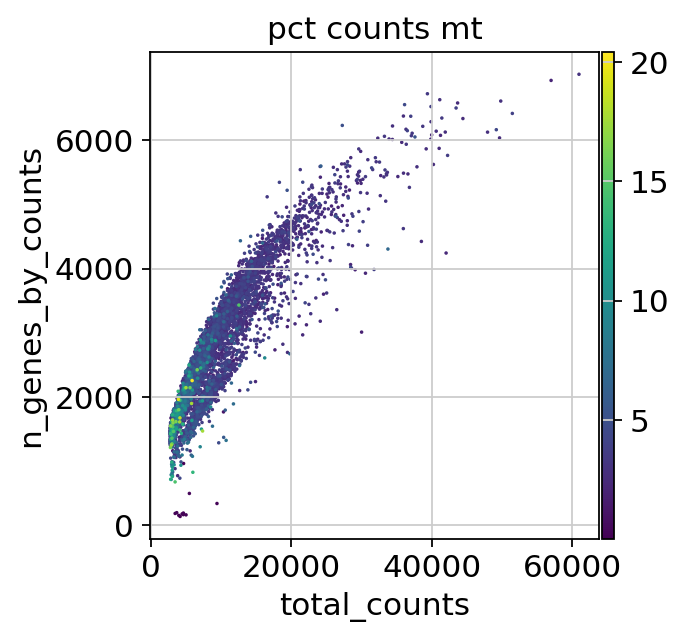

In [6]:
p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False)
# sc.pl.violin(adata, 'total_counts')
p2 = sc.pl.violin(adata, "pct_counts_mt")
p3 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [7]:
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [8]:
adata.obs["outlier"] = (
    is_outlier(adata, "log1p_total_counts", 5)
    | is_outlier(adata, "log1p_n_genes_by_counts", 5)
    | is_outlier(adata, "pct_counts_in_top_20_genes", 5)
)
adata.obs.outlier.value_counts()

False    10504
True      1401
Name: outlier, dtype: int64

In [ ]:
adata.obs["mt_outlier"] = is_outlier(adata, "pct_counts_mt", 3) | (
    adata.obs["pct_counts_mt"] > 8
)
adata.obs.mt_outlier.value_counts()

False    10765
True      1140
Name: mt_outlier, dtype: int64

In [11]:
print(f"Total number of cells: {adata.n_obs}")
adata = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")

Total number of cells: 11905
Number of cells after filtering of low quality cells: 9567


In [12]:
import logging

import anndata2ri
import rpy2.rinterface_lib.callbacks as rcb
import rpy2.robjects as ro

rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

In [13]:
print(adata.X)

  (0, 27936)	1.0
  (0, 27933)	1.0
  (0, 27920)	33.0
  (0, 27918)	1.0
  (0, 27917)	18.0
  (0, 27915)	2.0
  (0, 27914)	55.0
  (0, 27913)	66.0
  (0, 27912)	1.0
  (0, 27911)	39.0
  (0, 27910)	49.0
  (0, 27909)	12.0
  (0, 27908)	67.0
  (0, 27901)	1.0
  (0, 27898)	1.0
  (0, 27893)	1.0
  (0, 27886)	5.0
  (0, 27867)	1.0
  (0, 27864)	3.0
  (0, 27859)	1.0
  (0, 27858)	1.0
  (0, 27855)	1.0
  (0, 27849)	1.0
  (0, 27848)	1.0
  (0, 27841)	1.0
  :	:
  (9566, 343)	1.0
  (9566, 341)	1.0
  (9566, 340)	1.0
  (9566, 338)	1.0
  (9566, 327)	1.0
  (9566, 313)	1.0
  (9566, 309)	1.0
  (9566, 285)	2.0
  (9566, 281)	1.0
  (9566, 274)	1.0
  (9566, 269)	1.0
  (9566, 227)	9.0
  (9566, 224)	3.0
  (9566, 188)	4.0
  (9566, 131)	1.0
  (9566, 130)	1.0
  (9566, 122)	1.0
  (9566, 68)	1.0
  (9566, 67)	1.0
  (9566, 65)	1.0
  (9566, 62)	12.0
  (9566, 41)	1.0
  (9566, 39)	1.0
  (9566, 33)	3.0
  (9566, 10)	1.0


In [14]:
adata.layers["counts"] = adata.X

In [15]:
print(f"Total number of genes: {adata.n_vars}")

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print(f"Number of genes after cell filter: {adata.n_vars}")

Total number of genes: 27998
Number of genes after cell filter: 14745


In [16]:
%%R
library(Seurat)
library(scater)
library(scDblFinder)
library(BiocParallel)


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

Attaching SeuratObject
Loading required package: SingleCellExperiment
Loading required package: SummarizedExperiment
Loading required package: MatrixGenerics
Loading required package: matrixStats

Attaching package: 'MatrixGenerics'

The following objects are masked from 'package:matrixStats':

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedi

In [17]:
data_mat = adata.X.T

In [18]:
%%R -i data_mat -o doublet_score -o doublet_class

set.seed(123)
sce = scDblFinder(
    SingleCellExperiment(
        list(counts=data_mat),
    ) 
)
doublet_score = sce$scDblFinder.score
doublet_class = sce$scDblFinder.class

Creating ~7654 artificial doublets...
Dimensional reduction
Evaluating kNN...
Training model...
iter=0, 1376 cells excluded from training.
iter=1, 1394 cells excluded from training.
iter=2, 1417 cells excluded from training.
Threshold found:0.447
1030 (10.8%) doublets called


In [19]:
adata.obs["scDblFinder_score"] = doublet_score
adata.obs["scDblFinder_class"] = doublet_class
adata.obs.scDblFinder_class.value_counts()

singlet    8537
doublet    1030
Name: scDblFinder_class, dtype: int64

In [20]:
adata.write("p3_quality_control.h5ad")

## Concatenate and integrate datasets

In [1]:
# Python packages
import scanpy as sc
import scvi
import bbknn
import scib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import anndata as ad
from anndata import AnnData
import seaborn as sns
import celltypist
import anndata as ad
from celltypist import models
from scipy.stats import median_abs_deviation


sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=150,
    dpi_save=700,
    vector_friendly=False,
    facecolor="white",
    frameon=False,
)

# R interface
from rpy2.robjects import pandas2ri
from rpy2.robjects import r
import rpy2.rinterface_lib.callbacks
import anndata2ri

pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
2025-05-24 08:30:45.773718: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-24 08:30:45.773780: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-24 08:30:45.859930: E external/

In [3]:
e125 = sc.read("e125_quality_control.h5ad")
e135 = sc.read('/mnt/sdb/qdang/singlecell/mesothelium/lung/PMID_36881507_embryoatlas/rna/e135_lung_quality_control.h5ad')
e155 = sc.read("e155_quality_control.h5ad")
e175 = sc.read("e175_quality_control.h5ad")
p3 = sc.read("p3_quality_control.h5ad")

In [4]:
e135.X = e135.layers['soupX_counts'].copy()

In [6]:
####These are the timepoints that have mesothelial cells
adatas = {"E12.5": e125, "E13.5": e135, "E15.5": e155, "E17.5": e175, "P3": p3}
adatas = ad.concat(adatas, label="stage", join="outer")
adatas

AnnData object with n_obs × n_vars = 37875 × 19198
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'stage'
    layers: 'counts', 'soupX_counts'

In [7]:
adatas.obs_names_make_unique()
adatas.var_names_make_unique()
sc.pp.filter_cells(adatas, min_genes=200)

In [8]:
adatas

AnnData object with n_obs × n_vars = 37875 × 19198
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'stage', 'n_genes'
    layers: 'counts', 'soupX_counts'

In [9]:
scales_counts = sc.pp.normalize_total(adatas, target_sum=None, inplace=False)
# log1p transform
adatas.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

In [10]:
sc.pp.filter_genes(adatas, min_cells=1)
adatas

AnnData object with n_obs × n_vars = 37875 × 19198
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'stage', 'n_genes'
    var: 'n_cells'
    layers: 'counts', 'soupX_counts', 'log1p_norm'

In [11]:
print(adatas.X)

  (0, 9)	2.0
  (0, 12)	1.0
  (0, 25)	1.0
  (0, 26)	2.0
  (0, 29)	1.0
  (0, 34)	1.0
  (0, 44)	1.0
  (0, 47)	1.0
  (0, 61)	1.0
  (0, 73)	1.0
  (0, 126)	1.0
  (0, 241)	1.0
  (0, 248)	1.0
  (0, 249)	1.0
  (0, 261)	1.0
  (0, 279)	1.0
  (0, 302)	1.0
  (0, 305)	1.0
  (0, 320)	3.0
  (0, 321)	1.0
  (0, 327)	1.0
  (0, 338)	2.0
  (0, 363)	1.0
  (0, 383)	1.0
  (0, 409)	1.0
  :	:
  (37874, 18850)	3.0
  (37874, 18851)	1.0
  (37874, 18858)	1.0
  (37874, 18902)	1.0
  (37874, 18915)	3.0
  (37874, 18930)	1.0
  (37874, 18944)	1.0
  (37874, 18979)	3.0
  (37874, 19020)	1.0
  (37874, 19089)	1.0
  (37874, 19142)	1.0
  (37874, 19147)	2.0
  (37874, 19175)	1.0
  (37874, 19185)	51.0
  (37874, 19186)	1.0
  (37874, 19187)	19.0
  (37874, 19188)	25.0
  (37874, 19189)	27.0
  (37874, 19190)	30.0
  (37874, 19191)	25.0
  (37874, 19192)	10.0
  (37874, 19193)	2.0
  (37874, 19194)	11.0
  (37874, 19195)	1.0
  (37874, 19196)	1.0


In [12]:
adatas.layers["counts"] = adatas.X.copy()

In [13]:
adatas.X = adatas.layers['log1p_norm'].copy()

In [16]:
sc.pp.highly_variable_genes(
    adatas, n_top_genes=5000, flavor="cell_ranger", batch_key='stage'
)
adatas.var

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for mor

,n_cells,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection
0610005C13Rik,29,False,0.000354,0.079589,-0.054658,0,False
0610007P14Rik,16379,False,0.368794,0.419337,-0.026262,1,False
0610009B22Rik,14648,False,0.276920,0.536064,-0.529673,0,False
0610009E02Rik,1010,False,0.013097,0.073805,-0.297722,0,False
0610009L18Rik,2890,True,0.048829,0.678898,0.790815,2,False
...,...,...,...,...,...,...,...
mt-Nd3,25923,False,0.854417,0.353423,-0.224558,1,False
mt-Nd4,37807,False,2.521020,0.056269,-1.493265,0,False
mt-Nd4l,21225,False,0.956769,0.450369,-0.516209,0,False
mt-Nd5,28710,False,0.926469,0.356168,-0.419343,0,False


0    8776
1    4178
2    2112
5    1494
3    1424
4    1214
Name: highly_variable_nbatches, dtype: int64

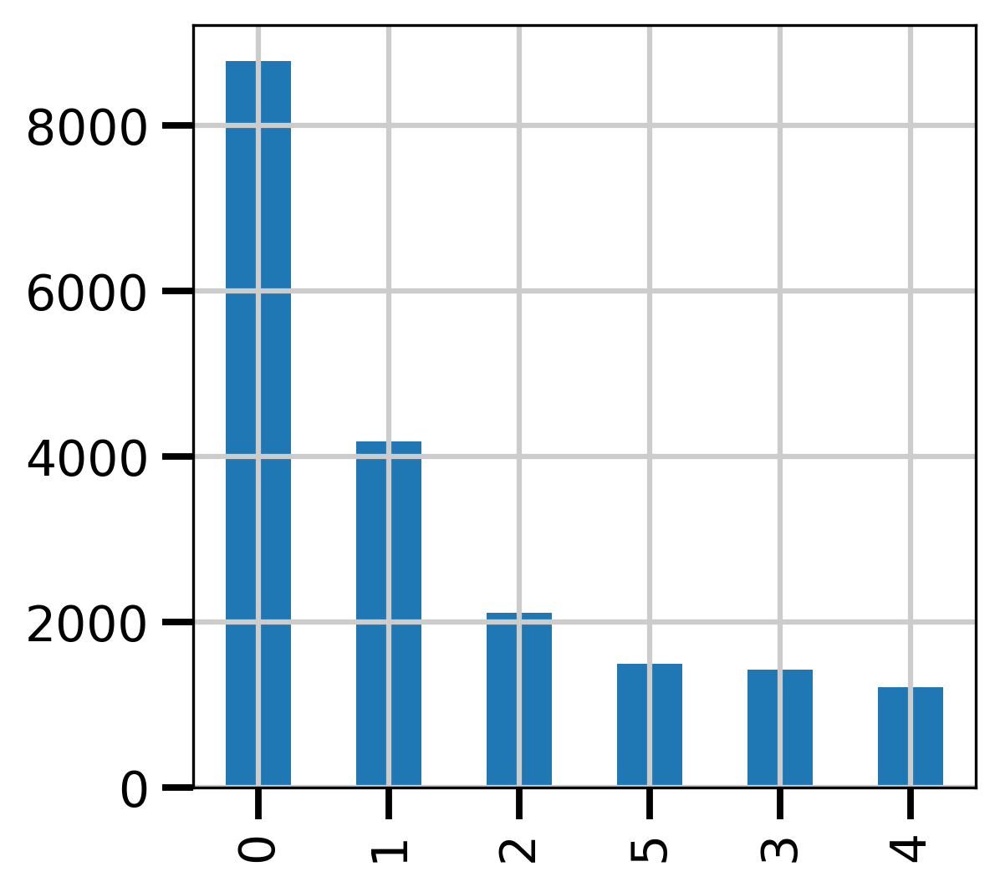

In [17]:
n_batches = adatas.var["highly_variable_nbatches"].value_counts()
ax = n_batches.plot(kind="bar")
n_batches

In [18]:
adatas.X = adatas.layers['counts'].copy()

In [19]:
adatas.raw = adatas

In [21]:
adata_hvg = adatas[:, adatas.var["highly_variable"]].copy()
adata_hvg

AnnData object with n_obs × n_vars = 37875 × 5000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'stage', 'n_genes'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg'
    layers: 'counts', 'soupX_counts', 'log1p_norm'

In [22]:
adatas.X = adatas.layers["log1p_norm"]

In [23]:
# setting highly variable as highly deviant to use scanpy 'use_highly_variable' argument in sc.pp.pca
sc.pp.pca(adatas, svd_solver="arpack", use_highly_variable=True)
sc.pp.neighbors(adatas)
sc.tl.umap(adatas)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/pynndescent/pynndescent_.py:346: NumbaPendingDeprecationWarning: Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced by 'new_style' in a future release. See details at https://numba.readthedocs.io/en/latest/reference/deprecation.html#deprecation-of-old-style-numba-captured-errors
Exception origin:
  File "/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/numba/core/types/functions.py", line 486, in __getnewargs__
    raise ReferenceError("underlying object has vanished")

  init_rp_tree(data, dist, current_graph, leaf_array)
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/pynndescent/pynndescent_.py:348: NumbaPendingDeprecationWarning: Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced by 'new_style' in a future release. See details at https://numba.readthedo

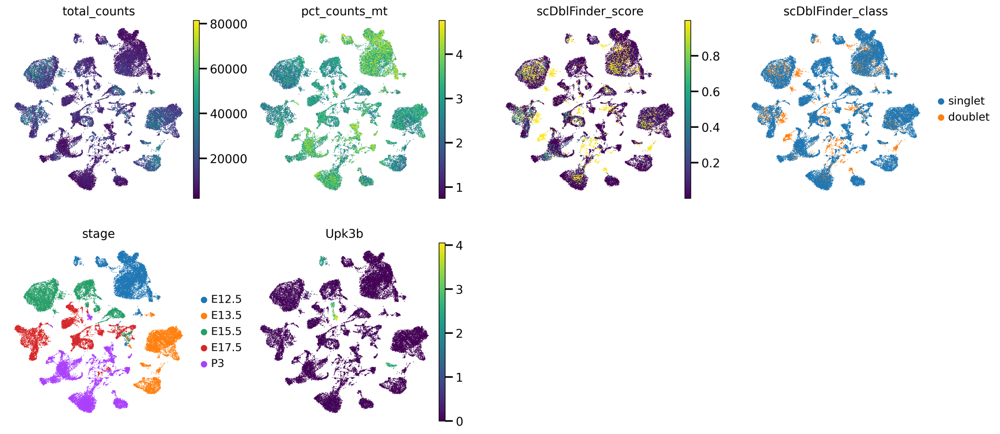

In [24]:
sc.pl.umap(
    adatas,
    color=["total_counts", "pct_counts_mt", "scDblFinder_score", "scDblFinder_class",'stage','Upk3b'],
    layer='log1p_norm'
)

In [25]:
adatas

AnnData object with n_obs × n_vars = 37875 × 19198
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'stage', 'n_genes'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'scDblFinder_class_colors', 'stage_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'soupX_counts', 'log1p_norm'
    obsp: 'distances', 'connectivities'

In [26]:
adata_nodbl = adatas[-adatas.obs["scDblFinder_class"].isin(["doublet"])]
adata_nodbl

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


View of AnnData object with n_obs × n_vars = 34158 × 19198
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'stage', 'n_genes'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'scDblFinder_class_colors', 'stage_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'soupX_counts', 'log1p_norm'
    obsp: 'distances', 'connectivities'

In [27]:
adata = adata_nodbl.copy()

In [28]:
import scvi

scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="stage")
vae = scvi.model.SCVI(adata, gene_likelihood="nb", n_layers=2, n_latent=30)
vae.train()
adata.obsm["scVI"] = vae.get_latent_representation()

Unable to initialize backend 'rocm': NOT_FOUND: Could not find registered platform with name: "rocm". Available platform names are: CUDA
Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 234/234: 100%|██████████| 234/234 [20:05<00:00,  5.13s/it, v_num=1, train_loss_step=8.53e+3, train_loss_epoch=7.92e+3]

`Trainer.fit` stopped: `max_epochs=234` reached.


Epoch 234/234: 100%|██████████| 234/234 [20:05<00:00,  5.15s/it, v_num=1, train_loss_step=8.53e+3, train_loss_epoch=7.92e+3]


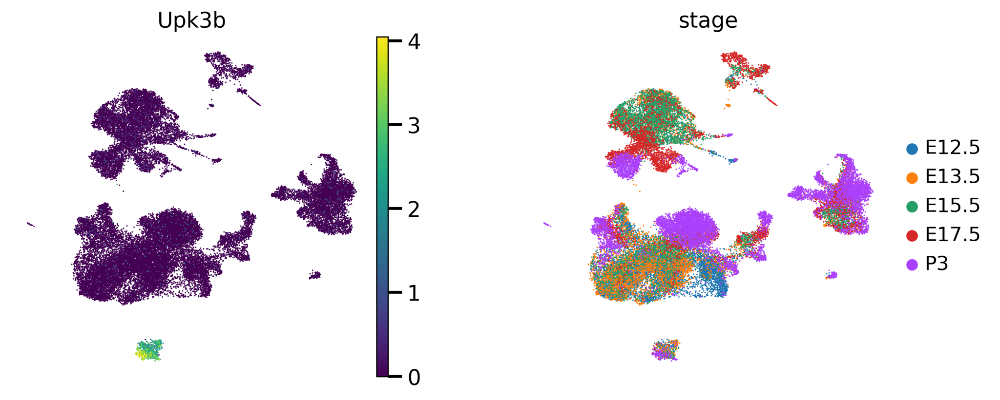

In [29]:
sc.pp.neighbors(adata, use_rep="scVI")
sc.tl.umap(adata)
sc.pl.umap(adata, color=["Upk3b", 'stage'], layer='log1p_norm', wspace=0.3)

In [4]:
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)
sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5)
sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


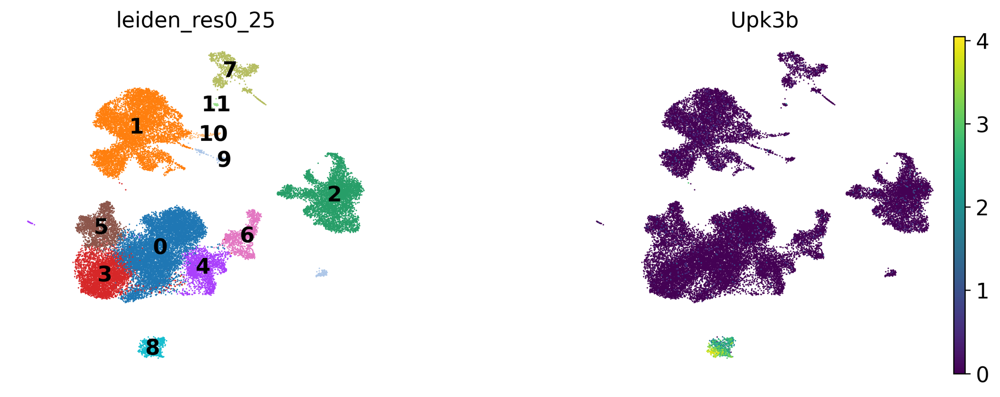

In [5]:
sc.pl.umap(adata, color=['leiden_res0_25','Upk3b'], wspace=0.4, layer='log1p_norm', legend_loc='on data')

In [6]:
epi = adata[adata.obs['leiden_res0_25'].isin(['8'])]
epi

View of AnnData object with n_obs × n_vars = 670 × 19198
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'stage', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'neighbors', 'pca', 'scDblFinder_class_colors', 'stage_colors', 'umap', 'leiden', 'leiden_res0_25_colors'
    obsm: 'X_pca', 'X_umap', 'scVI'
    varm: 'PCs'
    layers: 'counts', 'log1p_norm', 'soupX_counts'
    obsp: 'connectivities', 'distances'

In [9]:
scales_counts = sc.pp.normalize_total(epi, target_sum=None, inplace=False)
# log1p transform
epi.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

In [10]:
epi.layers['counts'] = epi.X.copy()

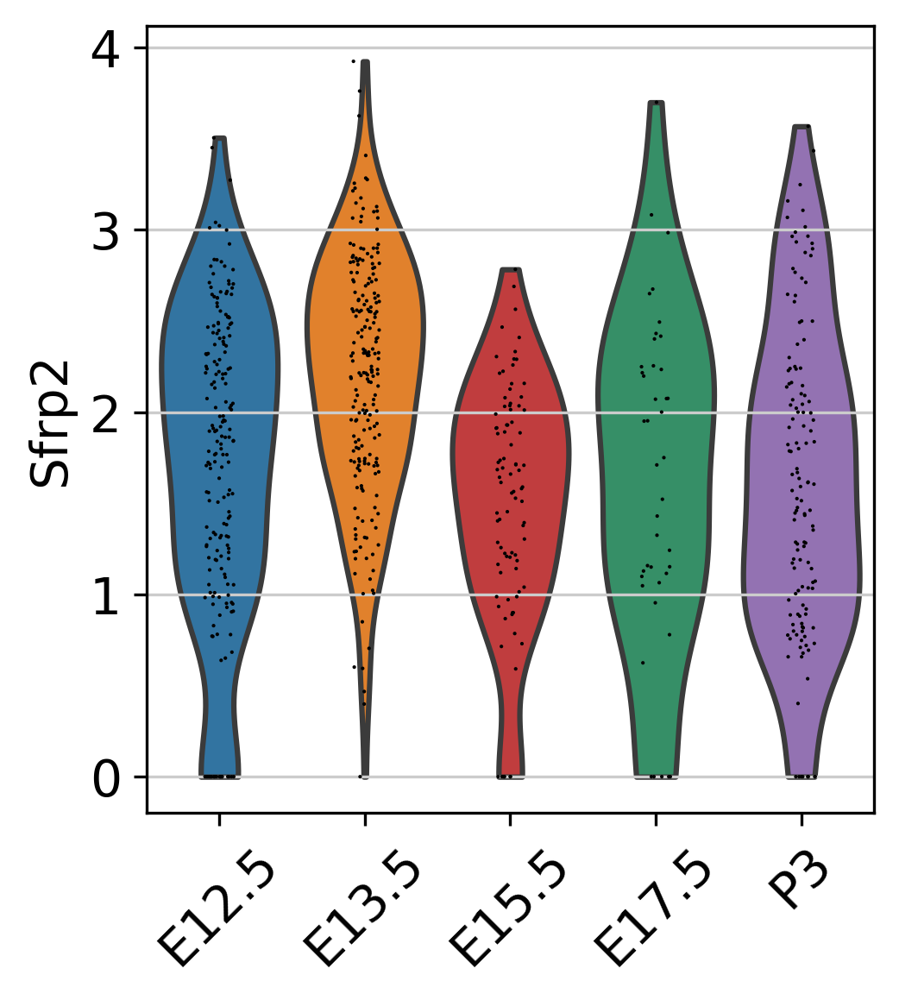

In [27]:
custom_palette = {
    'E17.5': '#279e68',
    'E12.5': '#1f77b4',
    'E13.5': '#ff7f0e',
    'E15.5': '#d62728',
    'P3': '#9467bd'
}
sc.pl.violin(epi, ['Sfrp2'],groupby='stage',layer='log1p_norm', rotation=45, use_raw=False, palette = custom_palette)

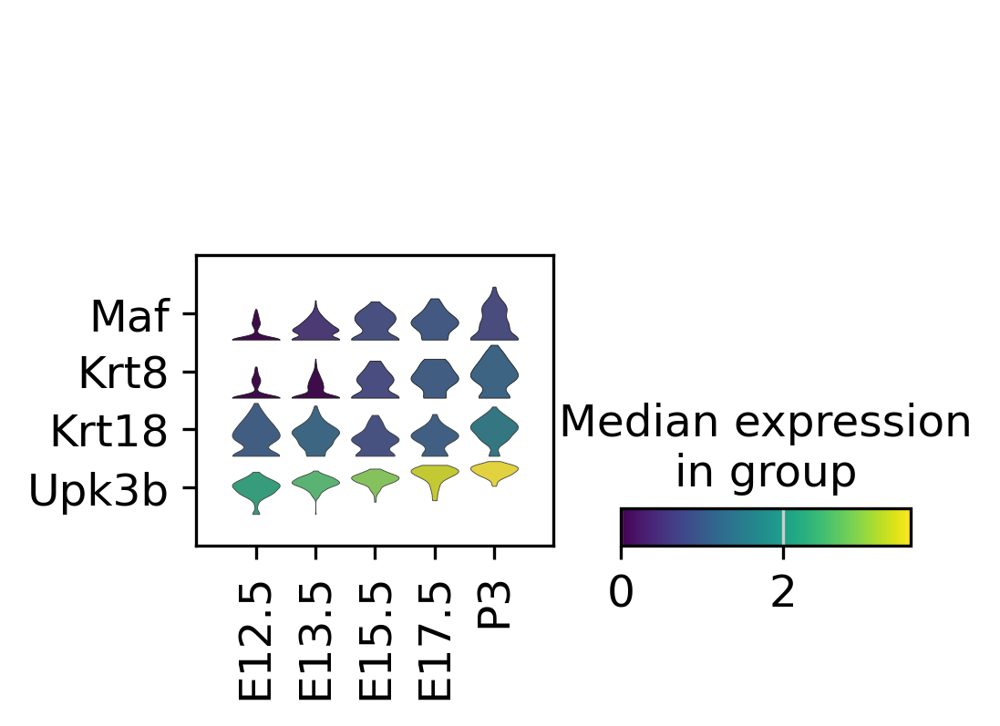

In [37]:
custom_palette = {
    'E17.5': '#279e68',
    'E12.5': '#1f77b4',
    'E13.5': '#ff7f0e',
    'E15.5': '#d62728',
    'P3': '#9467bd'
}
custom_colors = ['#279e68', '#1f77b4', '#ff7f0e', '#d62728', '#9467bd'] 
sc.pl.stacked_violin(epi, ['Maf','Krt8','Krt18','Upk3b'], groupby='stage',layer='log1p_norm', use_raw=False, cmap = 'viridis', swap_axes=True, save='allgenes_lung_time.pdf')
#

In [18]:
import scanpy as sc
print(sc.__version__)

1.9.5


/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


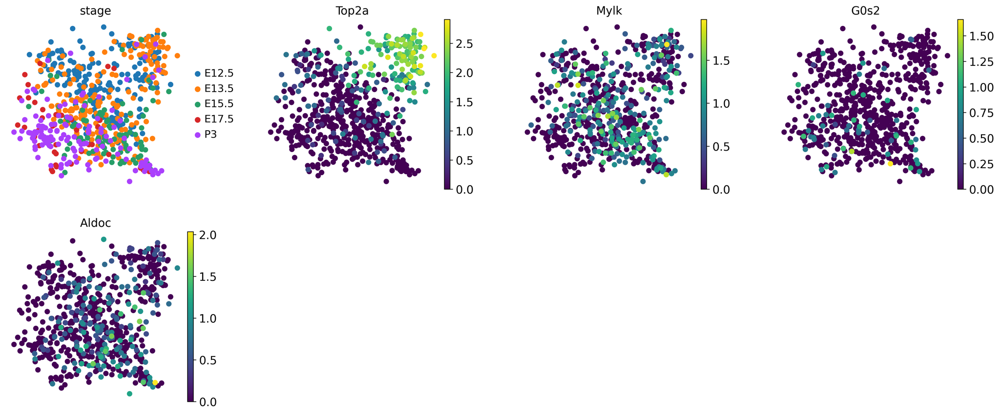

In [10]:
sc.pl.umap(epi, color=['stage','Top2a','Mylk','G0s2','Aldoc'], layer='log1p_norm', wspace=0.3)

In [27]:
sc.tl.leiden(epi, key_added="leiden_res0_25", resolution=0.25)
sc.tl.leiden(epi, key_added="leiden_res0_5", resolution=0.5)
sc.tl.leiden(epi, key_added="leiden_res0_4", resolution=0.4)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


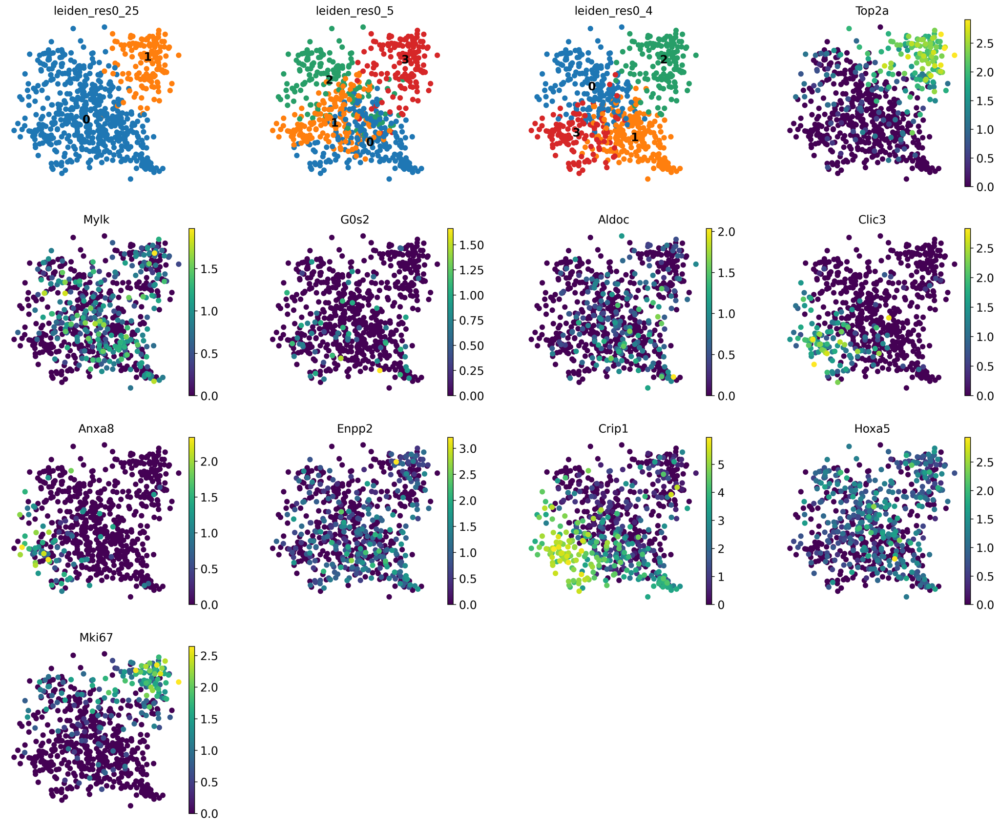

In [36]:
sc.pl.umap(epi, color=["leiden_res0_25","leiden_res0_5","leiden_res0_4",'Top2a',
                       'Mylk','G0s2','Aldoc','Clic3','Anxa8','Enpp2','Crip1',
                       'Hoxa5','Mki67'], layer='log1p_norm', wspace=0.3, legend_loc='on data')

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


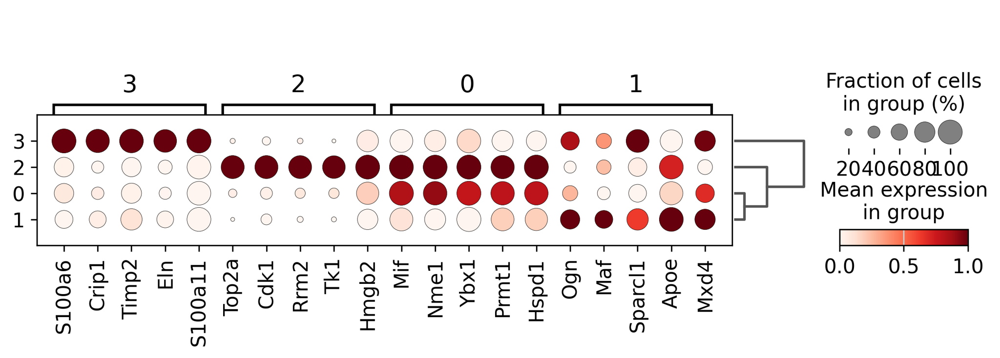

In [29]:
sc.tl.dendrogram(
    epi,
    groupby="leiden_res0_4"
)
sc.tl.rank_genes_groups(
    epi, groupby="leiden_res0_4", method="wilcoxon", key_added="dea_leiden_0_4"
)
sc.pl.rank_genes_groups_dotplot(
    epi, groupby="leiden_res0_4", standard_scale="var", n_genes=5, key="dea_leiden_0_4"
)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


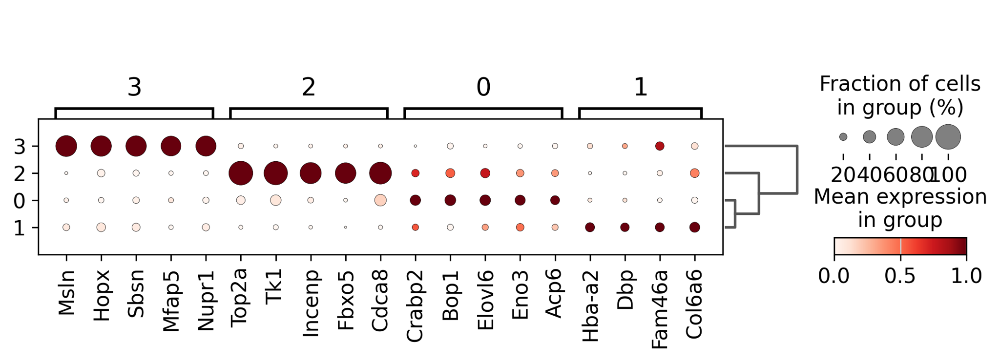

In [30]:
sc.tl.filter_rank_genes_groups(
    epi,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_0_4",
    key_added="dea_leiden_0_4_filtered",
)
sc.pl.rank_genes_groups_dotplot(
    epi,
    groupby="leiden_res0_4",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_0_4_filtered",
)

In [38]:
import numpy as np
epi.obs['leiden_res0_4'][epi.obs['leiden_res0_4']=='1']='0'
epi.obs['leiden_res0_4']=epi.obs['leiden_res0_4'].astype('str').astype('category')
### Reorder and rename the Leiden
epi.obs['leiden_res0_4'].cat.rename_categories(np.arange(len(np.unique(epi.obs['leiden_res0_4']))).astype('str'), inplace=True)

/tmp/ipykernel_1735050/3538758817.py:5: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  epi.obs['leiden_res0_4'].cat.rename_categories(np.arange(len(np.unique(epi.obs['leiden_res0_4']))).astype('str'), inplace=True)


/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


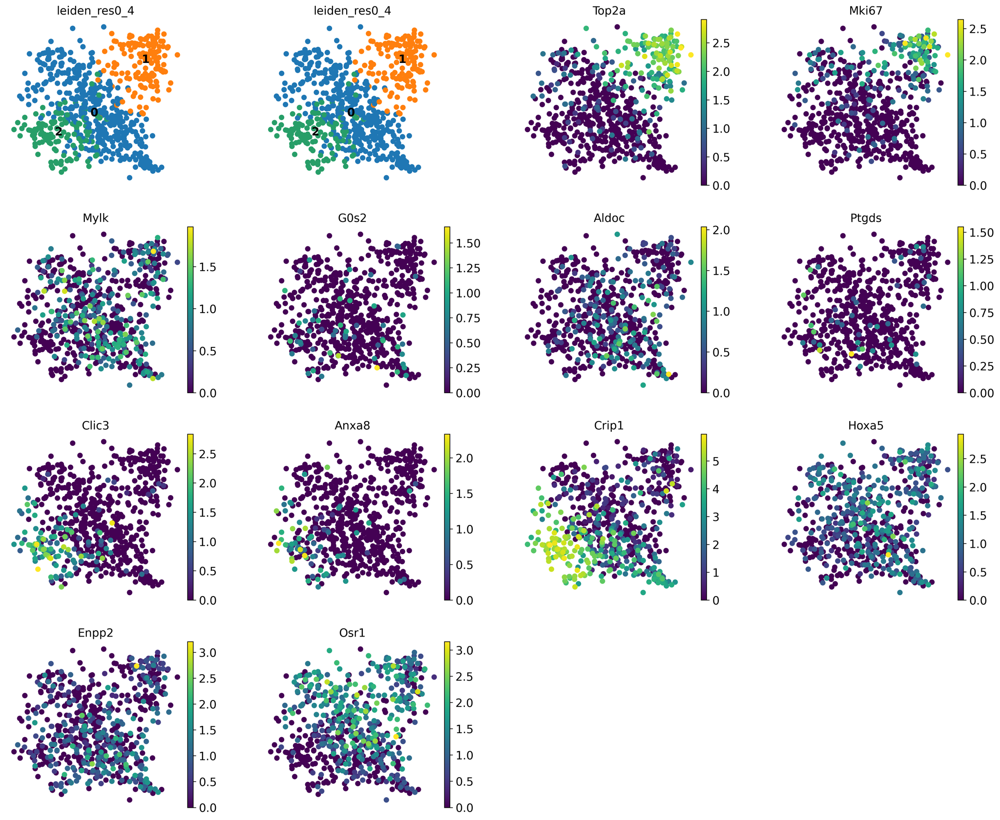

In [45]:
sc.pl.umap(epi, color=["leiden_res0_4","leiden_res0_4",'Top2a','Mki67',
                       'Mylk','G0s2','Aldoc','Ptgds',
                       'Clic3','Anxa8','Crip1',
                       'Hoxa5','Enpp2','Osr1'], layer='log1p_norm', wspace=0.3, legend_loc='on data')

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


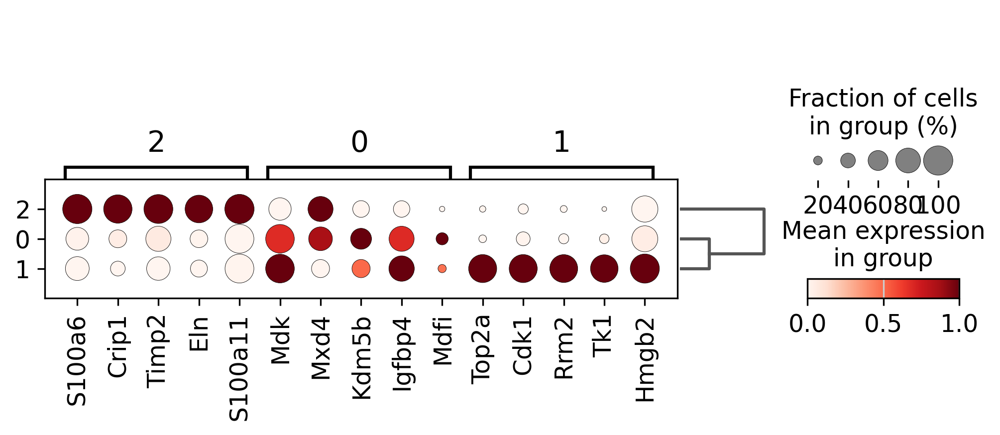

In [40]:
sc.tl.dendrogram(
    epi,
    groupby="leiden_res0_4"
)
sc.tl.rank_genes_groups(
    epi, groupby="leiden_res0_4", method="wilcoxon", key_added="dea_leiden_0_4"
)
sc.pl.rank_genes_groups_dotplot(
    epi, groupby="leiden_res0_4", standard_scale="var", n_genes=5, key="dea_leiden_0_4"
)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


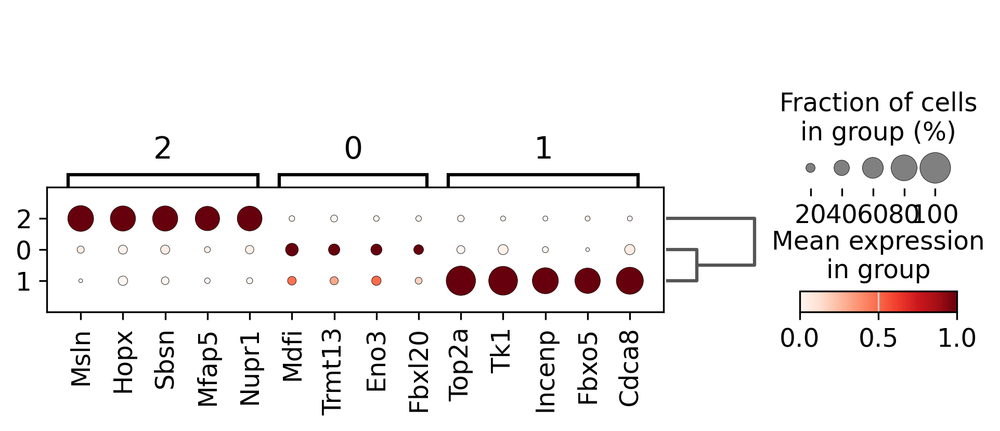

In [41]:
sc.tl.filter_rank_genes_groups(
    epi,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_0_4",
    key_added="dea_leiden_0_4_filtered",
)
sc.pl.rank_genes_groups_dotplot(
    epi,
    groupby="leiden_res0_4",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_0_4_filtered",
)

In [48]:
# create a dictionary to map cluster to annotation label
cluster2annotation = {
    "0": "Quiescent",
    "1": "Proliferating",
    "2": "Pericardial cavity"
}

# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
epi.obs["cell type"] = epi.obs["leiden_res0_4"].map(cluster2annotation).astype("category")

In [49]:
marker_genes_dict = {
    "Proliferating": ['Top2a','Mki67'],
    "Quiescent": ['Mylk','Aldoc'],
    "Pericardial cavity":['Clic3','Anxa8', 'Crip1']
}

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


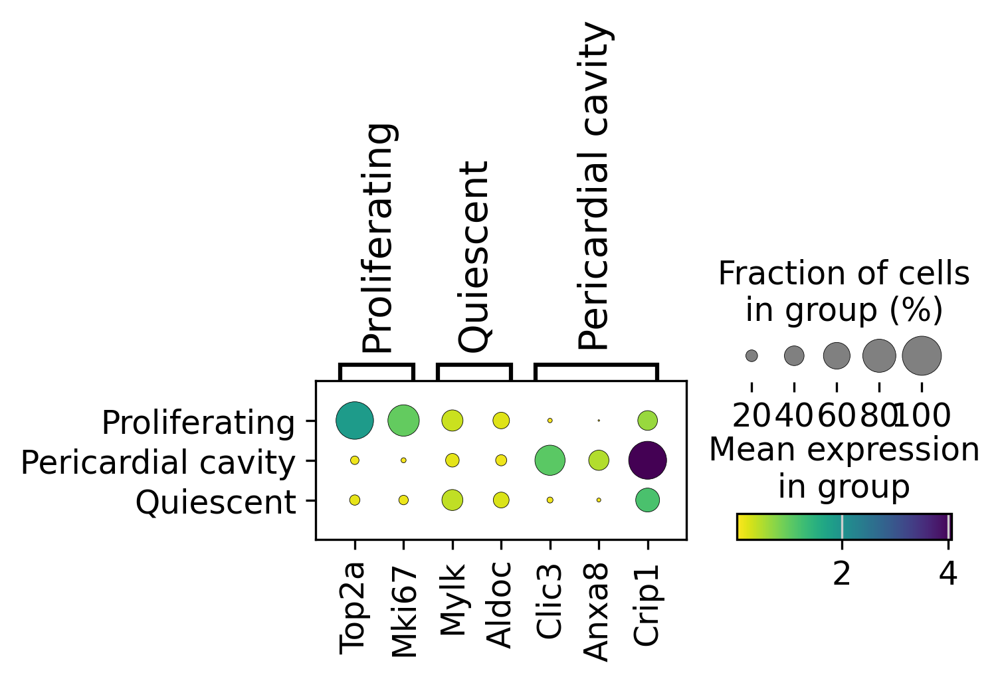

In [52]:
sc.pl.dotplot(epi, marker_genes_dict, groupby="cell type", layer='log1p_norm', dendrogram=False,
              categories_order=['Proliferating',
                                "Pericardial cavity",
                                'Quiescent'],
              cmap="viridis_r")

--- Absolute Counts ---
cell type  Quiescent  Proliferating  Pericardial cavity
stage                                                  
E12.5            134             57                   4
E13.5            129             68                  12
E15.5             71             11                   8
E17.5             16              3                  23
P3                52              6                  76

--- Proportions (%) ---
cell type  Quiescent  Proliferating  Pericardial cavity
stage                                                  
E12.5          68.72          29.23                2.05
E13.5          61.72          32.54                5.74
E15.5          78.89          12.22                8.89
E17.5          38.10           7.14               54.76
P3             38.81           4.48               56.72


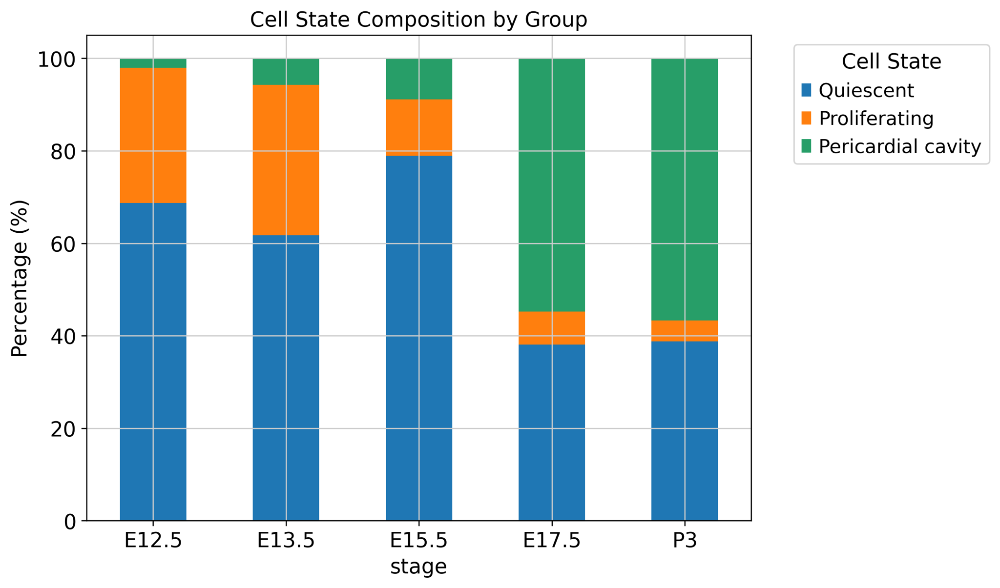

In [55]:
import pandas as pd
import scanpy as sc
import numpy as np

# --- 2. Calculate Absolute Counts ---
# Create a cross-tabulation of cell counts
counts_df = pd.crosstab(epi.obs['stage'], epi.obs['cell type'])
print("--- Absolute Counts ---")
print(counts_df)


# --- 3. Calculate Proportions (%) ---
# Use normalize='index' to calculate proportions across each row (group)
proportions_df = pd.crosstab(epi.obs['stage'], epi.obs['cell type'], normalize='index')
# Multiply by 100 and round to get percentages
proportions_df = (proportions_df * 100).round(2)
print("\n--- Proportions (%) ---")
print(proportions_df)


# --- 4. Visualize the Proportions ---
# Create a stacked bar plot
ax = proportions_df.plot(
    kind='bar',
    stacked=True,
    figsize=(8, 6),
    title='Cell State Composition by Group'
)
ax.set_ylabel("Percentage (%)")
ax.legend(title='Cell State', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.tick_params(axis='x', rotation=0)

In [53]:
del epi.uns['dea_leiden_0_4_filtered']

In [54]:
epi.write('/mnt/sdb/qdang/meso_project/sc_rna/lung/epionly_lung_integrated_scvi_annotated.h5ad')